#**Sea Animal Image Classification🌊**
[link text](https://https://www.kaggle.com/datasets/vencerlanz09/sea-animals-image-dataste?select=Turtle_Tortoise)


**Below Link is Dataset**

[link text](https://https://www.kaggle.com/datasets/vencerlanz09/sea-animals-image-dataste/download?datasetVersionNumber=5)

**Aquatic environments have been the birthplace of most life forms, with the oceans providing approximately 90% of the world's living space in terms of volume. The first known vertebrates were fish, exclusively found in water. Some fish evolved into amphibians, capable of surviving both on land and in water for parts of the day. Among amphibians, certain subgroups, including sea turtles, seals, manatees, and whales, further evolved into reptiles and mammals. Plant life, such as kelp and other algae, support some underwater habitats. The ocean's food chain relies on phytoplankton, crucial primary producers.**


**Aquatic environments are home to a diverse array of organisms, including microscopic phytoplankton, which serve as the base of the ocean food chain. Phytoplankton are important primary producers, using energy from the sun to produce organic matter through photosynthesis. They are an essential food source for a wide range of organisms, from zooplankton to large predators like sharks and whales. And We are in this project to detect the 23 different types of sea animals,using the Neural Network models.**

**Variable or Sea AnimalNames:-**

Clams
Corals
Crabs
Dolphin
Eel
Fish
JellyFish
Lobster
Nudibranchs
Octopus
Otter
Penguin
Puffers
Sea Rays
Sea Urchins
Seahorse
Seal
Sharks
Shrimp
Squid
Starfish
Turtle_Tortoise
Whale


# **Works we did in this project**



##1. Packages to import
##2. Undersampling
##3. Importing and setting up the Dataset & Data Preprocessing
##4. Visualizing images from the dataset

##5.**Models**
###A. Baseline Model
###B. BaseLine with Multiple Layers and Dropout Layer
###C. Depth wise separable and Residual Block
###D. Transfer Learning using Feature Extraction
###E. Transfer Learning Using ResNet101



##6. Fine Tuning
##7. Evaluate Model and Analyse Results
##8. Showing missclassified images in the validaiton data
##9. Making predictions on the Test Data
##10. Classification Reports and Confusion Matrix





##**Packges to import**

In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import zipfile, os
import shutil
import math
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
import tensorflow.keras.utils

import keras
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
#from keras.layers.normalization import BatchNormalization
from tensorflow.keras.layers import BatchNormalization
from keras.utils.np_utils import to_categorical

#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import schedules

%matplotlib inline
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools


from imutils import paths
import random
import math
from pathlib import Path
from pathlib import PurePath
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from keras.models import Model
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.applications import MobileNet
from sklearn.metrics import confusion_matrix
from keras.layers.core import Dense, Activation
from keras.metrics import categorical_crossentropy
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing import image_dataset_from_directory

##**Importing and setting up the Dataset & Data Preprocessing**

In [ ]:
import os
import zipfile
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file in your Drive
zip_path = '/content/drive/MyDrive/Datasets/archive.zip'

In [ ]:
# Set the path to the directory where you want to extract the images
extract_path = '/content/drive/MyDrive/final_dL'

In [ ]:
# Unzip the file and extract the images
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [ ]:
# Define the directories where your images are located
data_dir = '/content/drive/MyDrive/final_dL'

In [ ]:
# Define the directories for your training and validation sets
train_dir = '/content/drive/MyDrive/tvt/train'
val_dir = '/content/drive/MyDrive/tvt/val'
test_dir = '/content/drive/MyDrive/tvt/test'

In [ ]:
# Create the train and validation directories
if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(val_dir):
    os.makedirs(val_dir)
if not os.path.exists(test_dir):
    os.makedirs(test_dir)

In [ ]:
# Loop over each class directory in the data directory
for class_dir in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_dir)

    # Create the train, validation, and test directories for this class
    train_class_dir = os.path.join(train_dir, class_dir)
    val_class_dir = os.path.join(val_dir, class_dir)
    test_class_dir = os.path.join(test_dir, class_dir)
    if os.path.exists(train_class_dir):
        shutil.rmtree(train_class_dir)
    if os.path.exists(val_class_dir):
        shutil.rmtree(val_class_dir)
    if os.path.exists(test_class_dir):
        shutil.rmtree(test_class_dir)
    os.makedirs(train_class_dir)
    os.makedirs(val_class_dir)
    os.makedirs(test_class_dir)

    # Loop over the images in this class directory
    images = os.listdir(class_path)
    num_train = int(len(images) * 0.6)  # Use 60% of images for training
    num_val = int(len(images) * 0.2)  # Use 20% of images for validation
    train_images = images[:num_train]
    val_images = images[num_train:num_train+num_val]
    test_images = images[num_train+num_val:]

    # Move the training images to the train directory
    for image in train_images:
        src_path = os.path.join(class_path, image)
        dst_path = os.path.join(train_class_dir, image)
        if os.path.isdir(src_path):
            shutil.copytree(src_path, dst_path)
        else:
            shutil.copy(src_path, dst_path)

    # Move the validation images to the val directory
    for image in val_images:
        src_path = os.path.join(class_path, image)
        dst_path = os.path.join(val_class_dir, image)
        if os.path.isdir(src_path):
            shutil.copytree(src_path, dst_path)
        else:
            shutil.copy(src_path, dst_path)

    # Move the test images to the test directory
    for image in test_images:
        src_path = os.path.join(class_path, image)
        dst_path = os.path.join(test_class_dir, image)
        if os.path.isdir(src_path):
            shutil.copytree(src_path, dst_path)
        else:
            shutil.copy(src_path, dst_path)


In [ ]:
# Count images in train set
for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    count = len(os.listdir(category_dir))
    print(f"Train set: {count} images in category {category}")

# Count images in test set
for category in os.listdir(test_dir):
    category_dir = os.path.join(test_dir, category)
    count = len(os.listdir(category_dir))
    print(f"Test set: {count} images in category {category}")

# Count images in test set
for category in os.listdir(val_dir):
    category_dir = os.path.join(val_dir, category)
    count = len(os.listdir(category_dir))
    print(f"Val set: {count} images in category {category}")


Train set: 298 images in category Clams
Train set: 300 images in category Corals
Train set: 299 images in category Crabs
Train set: 469 images in category Dolphin
Train set: 298 images in category Eel
Train set: 296 images in category Fish
Train set: 507 images in category Jelly Fish
Train set: 299 images in category Lobster
Train set: 300 images in category Nudibranchs
Train set: 337 images in category Octopus
Train set: 300 images in category Otter
Train set: 289 images in category Penguin
Train set: 318 images in category Puffers
Train set: 310 images in category Sea Rays
Train set: 347 images in category Sea Urchins
Train set: 286 images in category Seahorse
Train set: 248 images in category Seal
Train set: 354 images in category Sharks
Train set: 292 images in category Shrimp
Train set: 289 images in category Squid
Train set: 299 images in category Starfish
Train set: 1141 images in category Turtle_Tortoise
Train set: 343 images in category Whale
Test set: 100 images in category C

In [ ]:
import tensorflow as tf

# Define the input size of the images
IMG_SIZE = 224

# Define the batch size
BATCH_SIZE = 32

# Create the train dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE)

# Create the validation dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    val_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE)

# Create the validation dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE)





Found 8219 files belonging to 23 classes.
Found 2732 files belonging to 23 classes.
Found 2760 files belonging to 23 classes.


In [ ]:
print(train_ds)

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
image_dir = Path(data_dir)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png')) + list(image_dir.glob(r'**/*.PNG'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

In [ ]:
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path("../input/sea-animals-image-dataste").rglob("*.jpg")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

In [ ]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,rotation_range = 40, width_shift_range = 0.2, height_shift_range = 0.2,
                                  shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True, fill_mode = 'nearest',
    validation_split=0.2) # set validation split

In [ ]:
train_images = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training') # set as training data

validation_images = train_datagen.flow_from_directory(
    data_dir , # same directory as training data
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation') # set as validation data

test_images = train_datagen.flow_from_directory(
    data_dir , # same directory as training data
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation') # set as validation data

Found 10967 images belonging to 23 classes.
Found 2730 images belonging to 23 classes.
Found 2730 images belonging to 23 classes.


##**Visualizing images from the dataset**

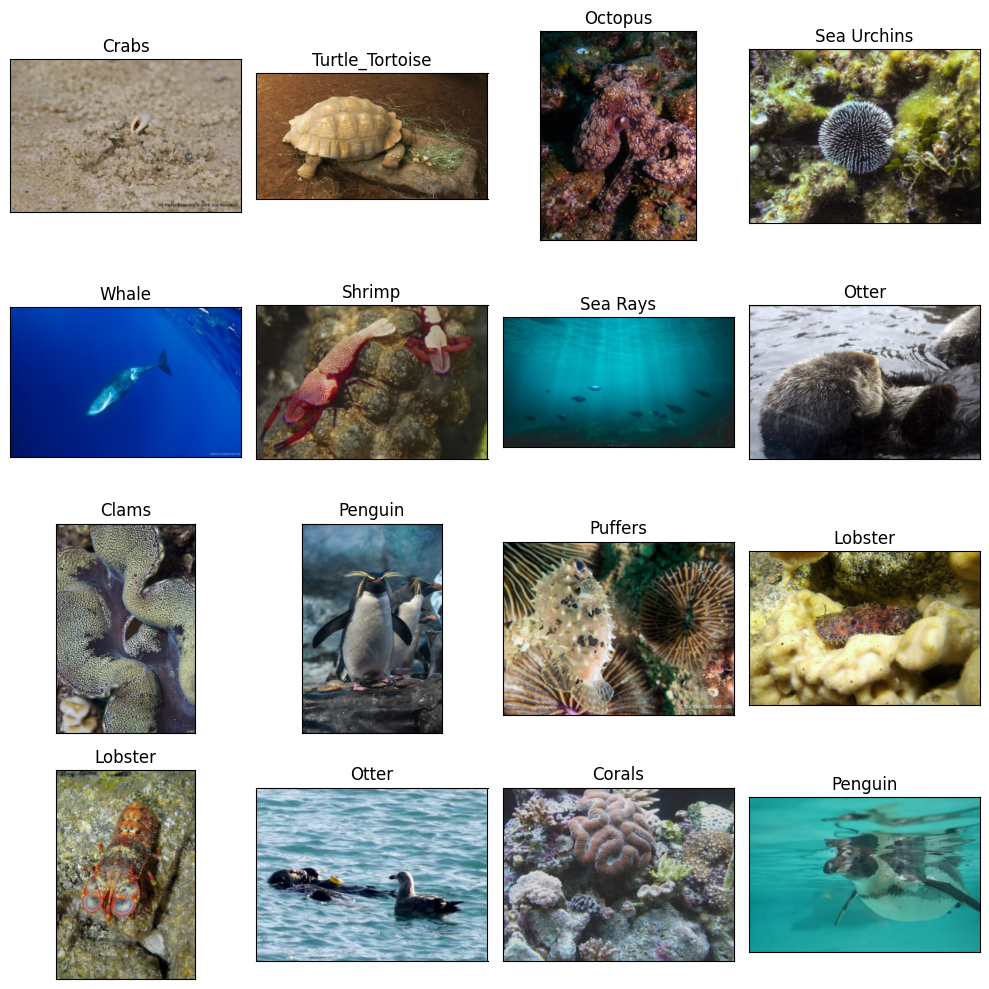

In [ ]:
# Display 23 picture of the dataset with their labels
random_index = np.random.randint(0, len(image_df), 23)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()

##**Baseline Model**

**To begin constructing the CNN model, we start with an input layer that contains information regarding the shape and type of data that the model will be processing. Unlike the Dense layer, the image does not require flattening for the conv2D layer. We incorporated multiple blocks that feature progressively larger filters, each consisting of a convolutional layer, a ReLU activation function, a batch normalisation layer, and a max pooling layer. Following these blocks is a GlobalAveragePooling layer, culminating in an output layer that utilises the softmax activation function.**

In [ ]:
def build_baseline(input_shape, filters, dropout_rate):
    #Configuring the model architecture

    #input layer for getting the input image
    input = keras.Input(shape=input_shape)

    #rescaling layer for rescaling pixels to [0,1] range
    x = layers.experimental.preprocessing.Rescaling(1./255)(input)

    for filter in filters:
        #A block of two conv+batchnorm+relu  layers for extracting features
        x = layers.Conv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        #x = layers.Dropout(dropout_rate)(x)

        #max pooling for downsampling
        x = layers.MaxPooling2D(pool_size=2, padding="same")(x)

    #Global Average pooling. This will get an input of shape (height, width, channels) the average of each feature map and returns a vector of size channels.
    x = layers.GlobalAveragePooling2D()(x)

    #The final output layer has one neuron with sigmoid activation to output the probability of the target class (cate or dog whichever is labeled as one)
    output = layers.Dense(23)(x)

    #create a model and set its input and output and return it
    model = keras.Model(inputs=input, outputs=output)
    return model

dropout_rate = 0.3
baseline = build_baseline(input_shape=(224,224,3), filters=[32,64,128,256], dropout_rate=dropout_rate)
print(baseline.summary())

# Set the learning rate schedule for the optimizer
initial_learning_rate = 1e-3
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1000,
    decay_rate=0.9)



Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      864       
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                           

**Loss function:** This function is used to evaluate the model's performance on images with known labels by calculating the difference between the observed and expected labels. For our multiclass classification task, we utilized the "categorical crossentropy" loss function. Our label variable was encoded using category encoding.

**Optimizer method:** The optimizer function is a critical component as it iteratively improves parameters like kernel values, bias of neurons, and weights to minimize the loss. The Adam optimizer was chosen for our model because it combines the benefits of two existing stochastic gradient descent modifications.

**Metric Function:** We employed the "accuracy" metric function to evaluate our model's performance. Unlike the loss function, the metric results are not used to train the model.

**We implemented two techniques during training to improve model performance:
Early stopping: This technique halts training if the validation loss fails to improve by at least 0.0001 after 10 epochs.**

**Model Checkpoint:** This method is used in conjunction with early stopping and enables continuous saving of the model during training after each epoch. We specify the file path and set the arguments save_best_only=True and monitor="val_loss". These parameters instruct the callback to only save a new file, overwriting any prior files, when the current value of the val_loss metric is lower than any previous value during training


In [ ]:
# Compiling the model
opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
baseline.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)

# Callback for early stopping. Stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, min_delta=1e-4, restore_best_weights=True)

# Save the checkpointed model in your google drive cnn_lab directory: "drive/MyDrive/cnn_lab/baseline_checkpoint" .
checkpoint = keras.callbacks.ModelCheckpoint(filepath="drive/MyDrive/fil_dl/baseline_checkpoint", save_best_only=True, monitor="val_loss")

# Train the model
history = baseline.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)

Epoch 1/50
257/257 [==============================] - ETA: 0s - loss: 2.4436 - accuracy: 0.2667

257/257 [==============================] - 204s 728ms/step - loss: 2.4436 - accuracy: 0.2667 - val_loss: 3.5749 - val_accuracy: 0.1054
Epoch 2/50
257/257 [==============================] - ETA: 0s - loss: 2.2597 - accuracy: 0.3167

257/257 [==============================] - 9s 36ms/step - loss: 2.2597 - accuracy: 0.3167 - val_loss: 2.9531 - val_accuracy: 0.2086
Epoch 3/50
255/257 [============================>.] - ETA: 0s - loss: 2.1644 - accuracy: 0.3357

257/257 [==============================] - 10s 37ms/step - loss: 2.1614 - accuracy: 0.3365 - val_loss: 2.5403 - val_accuracy: 0.2430
Epoch 4/50
257/257 [==============================] - ETA: 0s - loss: 2.1008 - accuracy: 0.3573

257/257 [==============================] - 9s 36ms/step - loss: 2.1008 - accuracy: 0.3573 - val_loss: 2.3288 - val_accuracy: 0.3108
Epoch 5/50
257/257 [==============================] - 7s 27ms/step - loss: 2.0299 - accuracy: 0.3814 - val_loss: 2.6568 - val_accuracy: 0.2709
Epoch 6/50
257/257 [==============================] - 7s 27ms/step - loss: 1.9868 - accuracy: 0.3893 - val_loss: 2.6697 - val_accuracy: 0.2299
Epoch 7/50
257/257 [==============================] - 7s 27ms/step - loss: 1.9396 - accuracy: 0.4105 - val_loss: 2.6773 - val_accuracy: 0.2376
Epoch 8/50
257/257 [==============================] - 7s 27ms/step - loss: 1.8932 - accuracy: 0.4182 - val_loss: 2.3433 - val_accuracy: 0.3448
Epoch 9/50
257/257 [==============================] - ETA: 0s - loss: 1.8705 - accuracy: 0.4292

257/257 [==============================] - 10s 37ms/step - loss: 1.8705 - accuracy: 0.4292 - val_loss: 2.2663 - val_accuracy: 0.3309
Epoch 10/50
257/257 [==============================] - ETA: 0s - loss: 1.8289 - accuracy: 0.4411

257/257 [==============================] - 10s 37ms/step - loss: 1.8289 - accuracy: 0.4411 - val_loss: 2.1126 - val_accuracy: 0.3785
Epoch 11/50
257/257 [==============================] - 7s 27ms/step - loss: 1.8065 - accuracy: 0.4440 - val_loss: 2.3007 - val_accuracy: 0.3280
Epoch 12/50
257/257 [==============================] - 7s 28ms/step - loss: 1.7770 - accuracy: 0.4518 - val_loss: 2.1307 - val_accuracy: 0.3690
Epoch 13/50
257/257 [==============================] - 7s 27ms/step - loss: 1.7411 - accuracy: 0.4687 - val_loss: 2.1794 - val_accuracy: 0.3543
Epoch 14/50
257/257 [==============================] - ETA: 0s - loss: 1.7041 - accuracy: 0.4774

257/257 [==============================] - 9s 35ms/step - loss: 1.7041 - accuracy: 0.4774 - val_loss: 2.1076 - val_accuracy: 0.3825
Epoch 15/50
257/257 [==============================] - 7s 27ms/step - loss: 1.6825 - accuracy: 0.4825 - val_loss: 2.1264 - val_accuracy: 0.3664
Epoch 16/50
257/257 [==============================] - 7s 28ms/step - loss: 1.6494 - accuracy: 0.4993 - val_loss: 2.1538 - val_accuracy: 0.3668
Epoch 17/50
257/257 [==============================] - 7s 28ms/step - loss: 1.6301 - accuracy: 0.5025 - val_loss: 2.2972 - val_accuracy: 0.3492
Epoch 18/50
257/257 [==============================] - 7s 27ms/step - loss: 1.5947 - accuracy: 0.5159 - val_loss: 2.1122 - val_accuracy: 0.3723
Epoch 19/50
257/257 [==============================] - 7s 28ms/step - loss: 1.5746 - accuracy: 0.5136 - val_loss: 2.1905 - val_accuracy: 0.3840
Epoch 20/50
257/257 [==============================] - 7s 27ms/step - loss: 1.5407 - accuracy: 0.5339 - val_loss: 2.2213 - val_accuracy: 0.3675
Epoc

257/257 [==============================] - 10s 36ms/step - loss: 1.4437 - accuracy: 0.5532 - val_loss: 2.0385 - val_accuracy: 0.4198
Epoch 25/50
257/257 [==============================] - 7s 28ms/step - loss: 1.4225 - accuracy: 0.5643 - val_loss: 2.0962 - val_accuracy: 0.3810
Epoch 26/50
257/257 [==============================] - ETA: 0s - loss: 1.4002 - accuracy: 0.5733

257/257 [==============================] - 10s 37ms/step - loss: 1.4002 - accuracy: 0.5733 - val_loss: 1.9538 - val_accuracy: 0.4473
Epoch 27/50
257/257 [==============================] - 7s 28ms/step - loss: 1.3795 - accuracy: 0.5759 - val_loss: 2.4278 - val_accuracy: 0.3580
Epoch 28/50
257/257 [==============================] - 7s 27ms/step - loss: 1.3620 - accuracy: 0.5799 - val_loss: 2.0134 - val_accuracy: 0.4407
Epoch 29/50
257/257 [==============================] - ETA: 0s - loss: 1.3340 - accuracy: 0.5906

257/257 [==============================] - 9s 36ms/step - loss: 1.3340 - accuracy: 0.5906 - val_loss: 1.8601 - val_accuracy: 0.4810
Epoch 30/50
257/257 [==============================] - 7s 27ms/step - loss: 1.3201 - accuracy: 0.5981 - val_loss: 1.8977 - val_accuracy: 0.4612
Epoch 31/50
257/257 [==============================] - 7s 27ms/step - loss: 1.3023 - accuracy: 0.6040 - val_loss: 1.9309 - val_accuracy: 0.4513
Epoch 32/50
257/257 [==============================] - 7s 28ms/step - loss: 1.2828 - accuracy: 0.6060 - val_loss: 2.1151 - val_accuracy: 0.4290
Epoch 33/50
257/257 [==============================] - 7s 28ms/step - loss: 1.2708 - accuracy: 0.6079 - val_loss: 2.1384 - val_accuracy: 0.4272
Epoch 34/50
257/257 [==============================] - 7s 28ms/step - loss: 1.2553 - accuracy: 0.6141 - val_loss: 2.1043 - val_accuracy: 0.4308
Epoch 35/50
257/257 [==============================] - 7s 27ms/step - loss: 1.2291 - accuracy: 0.6200 - val_loss: 2.0025 - val_accuracy: 0.4462
Epoc

we can see that the model was trained on a dataset using 50 epochs. In the first epoch, the model had a loss of 2.44 and an accuracy of 0.27 on the training set, and a validation loss of 2.20 and validation accuracy of 0.43.

As the epochs progress, we can see that the training loss decreases and the accuracy increases, indicating that the model is learning from the data. However, the validation loss remains high and the validation accuracy does not improve significantly, indicating that the model is overfitting on the training data and not generalizing well to new data.

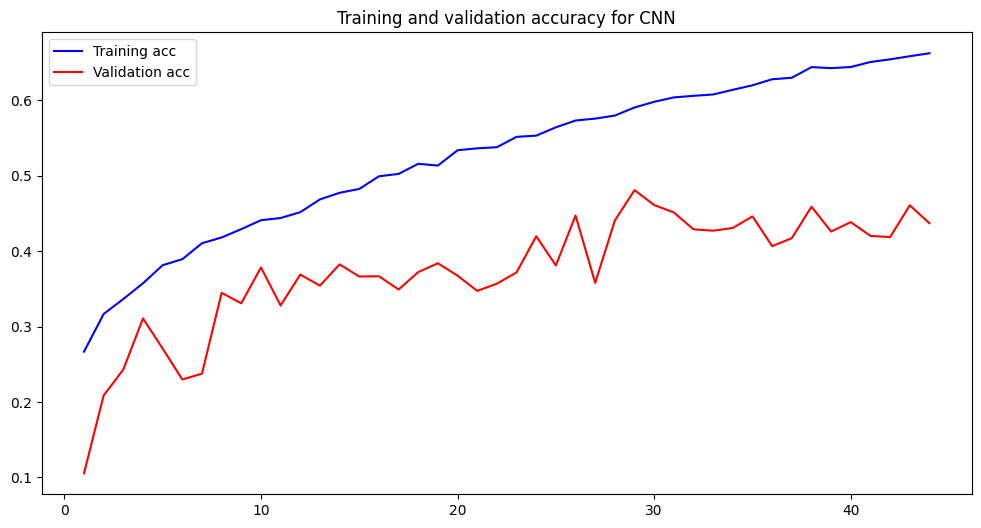

<Figure size 640x480 with 0 Axes>

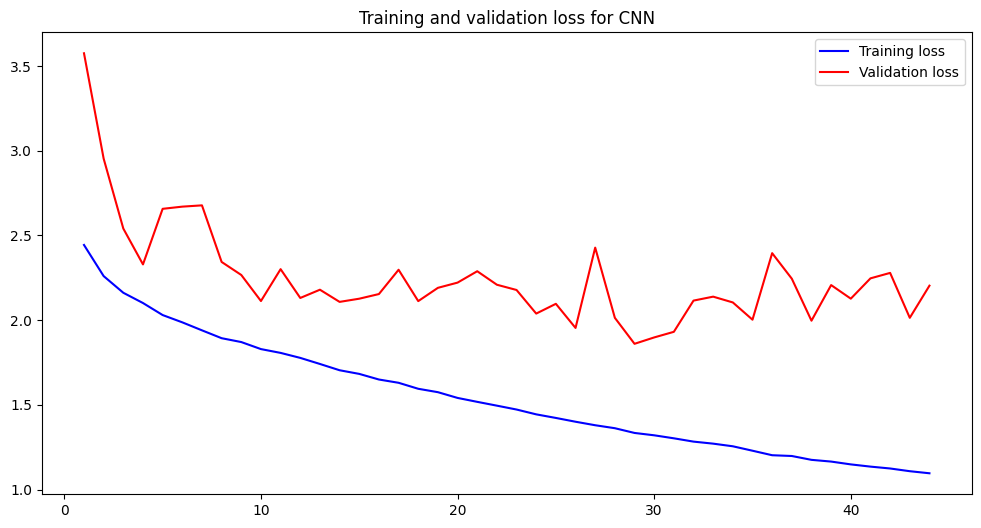

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

## **BaseLine with Multiple Layers and Dropout Layer**

**Adding more layers can help extract additional features from the data, but only to a certain extent. Beyond a certain point, adding more layers can lead to overfitting, where the model becomes too closely fitted to the training data and loses its ability to generalize to new data. Overfitting can result in issues such as false positives.**

**To address this problem, dropout layers are commonly used in CNN training. Dropout layers prevent overfitting by randomly dropping out some nodes during training, which reduces the impact of any one batch of training data on the learning process. Dropout layers are typically more effective when placed between fully connected/Dense layers. In this case, dropout can be applied after the GlobalAveragePooling layer.**

**Another technique that can help prevent overfitting is batch normalization, which normalizes the output of a previous activation layer by re-centering and rescaling it. This can help avoid overfitting by reducing the covariance shift between layers during training. By combining dropout and batch normalization, we can effectively reduce overfitting and improve the performance of the model.**

In [ ]:
def build_baseline_with_multiple_layers(input_shape, filters):

  #Configuring the model architecture

  #input layer for getting the input image
  input = keras.Input(shape=input_shape)

  #rescaling layer for rescalign pixels to [0,1] range
  x = layers.experimental.preprocessing.Rescaling(1./255)(input)


  for filter in filters:
    #A block conv+batchnorm+relu  layers for extractign features
    x =layers.Conv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
    x= layers.BatchNormalization()(x)
    x= layers.ReLU()(x)
    x =layers.Conv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
    x= layers.BatchNormalization()(x)
    x= layers.ReLU()(x)
    x =layers.Conv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
    x= layers.BatchNormalization()(x)
    x= layers.ReLU()(x)


    #max pooling for downsampling
    x = layers.MaxPooling2D(pool_size=2, padding="same")(x)

  #Global Average pooling. This will get an input of shape (height, width, channels) the average of each feature map and returns a vector of size channels.
  x = layers.GlobalAveragePooling2D()(x)

  # Dropout Layer
  x = layers.Dropout(0.5)(x)

  #The final output layer has one neuron with sigmoid activation to output the probability of the target class ( cate or dog whichever is labled as one)
  output=layers.Dense(23)(x)
  #create a model and set its input and output and return it
  model = keras.Model(inputs=input, outputs=output)
  return model

baseline_with_multilayers=build_baseline_with_multiple_layers(input_shape=(224,224,3), filters=[32,64,128, 256])
print(baseline_with_multilayers.summary())



Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 224, 224, 32)      864       
                                                                 
 batch_normalization_4 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                                 
                                                                 
 re_lu_4 (ReLU)              (None, 224, 224, 32)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 224, 224, 32)      9216      
                                                           

In [ ]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9)

#compiling the model
opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
baseline_with_multilayers.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)

In [ ]:
#callback for early stopping. stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True)

#save the checkpointed model in your google drive cnn_lab directory: "drive/MyDrive/cnn_lab/baseline_checkpoint" .
checkpoint= keras.callbacks.ModelCheckpoint( filepath="drive/MyDrive/fil_dl/baseline_checkpoint",save_best_only=True, monitor="val_loss")

history = baseline_with_multilayers.fit(
            train_ds,
            validation_data = val_ds,
            epochs = 50,
            verbose = 1,
            callbacks=[early_stopping, checkpoint])

Epoch 1/50
257/257 [==============================] - ETA: 0s - loss: 2.7758 - accuracy: 0.2057

257/257 [==============================] - 95s 332ms/step - loss: 2.7758 - accuracy: 0.2057 - val_loss: 4.6068 - val_accuracy: 0.0787
Epoch 2/50
257/257 [==============================] - ETA: 0s - loss: 2.5969 - accuracy: 0.2284

257/257 [==============================] - 82s 317ms/step - loss: 2.5969 - accuracy: 0.2284 - val_loss: 3.2280 - val_accuracy: 0.1713
Epoch 3/50
257/257 [==============================] - ETA: 0s - loss: 2.5031 - accuracy: 0.2450

257/257 [==============================] - 85s 331ms/step - loss: 2.5031 - accuracy: 0.2450 - val_loss: 3.0202 - val_accuracy: 0.2013
Epoch 4/50
257/257 [==============================] - ETA: 0s - loss: 2.4307 - accuracy: 0.2658

257/257 [==============================] - 82s 318ms/step - loss: 2.4307 - accuracy: 0.2658 - val_loss: 2.8705 - val_accuracy: 0.2193
Epoch 5/50
257/257 [==============================] - 77s 298ms/step - loss: 2.3942 - accuracy: 0.2667 - val_loss: 3.4647 - val_accuracy: 0.1823
Epoch 6/50
257/257 [==============================] - ETA: 0s - loss: 2.3239 - accuracy: 0.2858

257/257 [==============================] - 82s 317ms/step - loss: 2.3239 - accuracy: 0.2858 - val_loss: 2.5137 - val_accuracy: 0.2687
Epoch 7/50
257/257 [==============================] - ETA: 0s - loss: 2.2832 - accuracy: 0.2974

257/257 [==============================] - 82s 318ms/step - loss: 2.2832 - accuracy: 0.2974 - val_loss: 2.3730 - val_accuracy: 0.2584
Epoch 8/50
257/257 [==============================] - 77s 298ms/step - loss: 2.2363 - accuracy: 0.3049 - val_loss: 2.8756 - val_accuracy: 0.2156
Epoch 9/50
257/257 [==============================] - 77s 299ms/step - loss: 2.2081 - accuracy: 0.3149 - val_loss: 2.8001 - val_accuracy: 0.2522
Epoch 10/50
257/257 [==============================] - 77s 298ms/step - loss: 2.1533 - accuracy: 0.3320 - val_loss: 2.6756 - val_accuracy: 0.2379
Epoch 11/50
257/257 [==============================] - 77s 299ms/step - loss: 2.1077 - accuracy: 0.3492 - val_loss: 2.4502 - val_accuracy: 0.2701
Epoch 12/50
257/257 [==============================] - ETA: 0s - loss: 2.0631 - accuracy: 0.3601

257/257 [==============================] - 82s 317ms/step - loss: 2.0631 - accuracy: 0.3601 - val_loss: 2.3086 - val_accuracy: 0.3217
Epoch 13/50
257/257 [==============================] - 77s 299ms/step - loss: 2.0478 - accuracy: 0.3609 - val_loss: 2.5551 - val_accuracy: 0.2672
Epoch 14/50
257/257 [==============================] - ETA: 0s - loss: 2.0087 - accuracy: 0.3799

257/257 [==============================] - 82s 318ms/step - loss: 2.0087 - accuracy: 0.3799 - val_loss: 2.1779 - val_accuracy: 0.3521
Epoch 15/50
257/257 [==============================] - 77s 299ms/step - loss: 1.9778 - accuracy: 0.3800 - val_loss: 2.2138 - val_accuracy: 0.3232
Epoch 16/50
257/257 [==============================] - 77s 300ms/step - loss: 1.9392 - accuracy: 0.3990 - val_loss: 2.2957 - val_accuracy: 0.3221
Epoch 17/50
257/257 [==============================] - 77s 298ms/step - loss: 1.9406 - accuracy: 0.3965 - val_loss: 2.5260 - val_accuracy: 0.2679
Epoch 18/50
257/257 [==============================] - ETA: 0s - loss: 1.8961 - accuracy: 0.4078

257/257 [==============================] - 82s 318ms/step - loss: 1.8961 - accuracy: 0.4078 - val_loss: 2.1124 - val_accuracy: 0.3668
Epoch 19/50
257/257 [==============================] - 78s 301ms/step - loss: 1.8779 - accuracy: 0.4140 - val_loss: 2.2828 - val_accuracy: 0.3602
Epoch 20/50
257/257 [==============================] - ETA: 0s - loss: 1.8450 - accuracy: 0.4237

257/257 [==============================] - 82s 318ms/step - loss: 1.8450 - accuracy: 0.4237 - val_loss: 2.0536 - val_accuracy: 0.3917
Epoch 21/50
257/257 [==============================] - 77s 300ms/step - loss: 1.8044 - accuracy: 0.4407 - val_loss: 2.1405 - val_accuracy: 0.3510
Epoch 22/50
257/257 [==============================] - 77s 300ms/step - loss: 1.8028 - accuracy: 0.4421 - val_loss: 2.2966 - val_accuracy: 0.3452
Epoch 23/50
257/257 [==============================] - ETA: 0s - loss: 1.7664 - accuracy: 0.4542

257/257 [==============================] - 82s 318ms/step - loss: 1.7664 - accuracy: 0.4542 - val_loss: 2.0181 - val_accuracy: 0.3957
Epoch 24/50
257/257 [==============================] - 77s 300ms/step - loss: 1.7380 - accuracy: 0.4609 - val_loss: 2.1019 - val_accuracy: 0.3770
Epoch 25/50
257/257 [==============================] - ETA: 0s - loss: 1.7204 - accuracy: 0.4643

257/257 [==============================] - 82s 319ms/step - loss: 1.7204 - accuracy: 0.4643 - val_loss: 1.9266 - val_accuracy: 0.4290
Epoch 26/50
257/257 [==============================] - 77s 300ms/step - loss: 1.6894 - accuracy: 0.4704 - val_loss: 1.9942 - val_accuracy: 0.4074
Epoch 27/50
257/257 [==============================] - 77s 300ms/step - loss: 1.6638 - accuracy: 0.4834 - val_loss: 2.0445 - val_accuracy: 0.4001
Epoch 28/50
257/257 [==============================] - ETA: 0s - loss: 1.6310 - accuracy: 0.4912

257/257 [==============================] - 82s 318ms/step - loss: 1.6310 - accuracy: 0.4912 - val_loss: 1.8654 - val_accuracy: 0.4403
Epoch 29/50
257/257 [==============================] - 77s 300ms/step - loss: 1.6046 - accuracy: 0.5002 - val_loss: 1.9551 - val_accuracy: 0.4418
Epoch 30/50
257/257 [==============================] - ETA: 0s - loss: 1.6061 - accuracy: 0.5007

257/257 [==============================] - 82s 319ms/step - loss: 1.6061 - accuracy: 0.5007 - val_loss: 1.8394 - val_accuracy: 0.4696
Epoch 31/50
257/257 [==============================] - 77s 300ms/step - loss: 1.5596 - accuracy: 0.5154 - val_loss: 2.0087 - val_accuracy: 0.4286
Epoch 32/50
257/257 [==============================] - 77s 300ms/step - loss: 1.5409 - accuracy: 0.5166 - val_loss: 1.8581 - val_accuracy: 0.4539
Epoch 33/50
257/257 [==============================] - ETA: 0s - loss: 1.5368 - accuracy: 0.5220

257/257 [==============================] - 82s 318ms/step - loss: 1.5368 - accuracy: 0.5220 - val_loss: 1.7509 - val_accuracy: 0.4857
Epoch 34/50
257/257 [==============================] - 77s 300ms/step - loss: 1.4904 - accuracy: 0.5330 - val_loss: 1.9081 - val_accuracy: 0.4451
Epoch 35/50
257/257 [==============================] - 77s 300ms/step - loss: 1.4817 - accuracy: 0.5414 - val_loss: 1.9195 - val_accuracy: 0.4553
Epoch 36/50
257/257 [==============================] - 77s 300ms/step - loss: 1.4577 - accuracy: 0.5463 - val_loss: 1.9343 - val_accuracy: 0.4510
Epoch 37/50
257/257 [==============================] - 77s 299ms/step - loss: 1.4429 - accuracy: 0.5491 - val_loss: 1.8262 - val_accuracy: 0.4590
Epoch 38/50
257/257 [==============================] - 77s 299ms/step - loss: 1.4117 - accuracy: 0.5602 - val_loss: 1.7950 - val_accuracy: 0.4751
Epoch 39/50
257/257 [==============================] - 78s 301ms/step - loss: 1.3991 - accuracy: 0.5654 - val_loss: 1.7698 - val_accurac

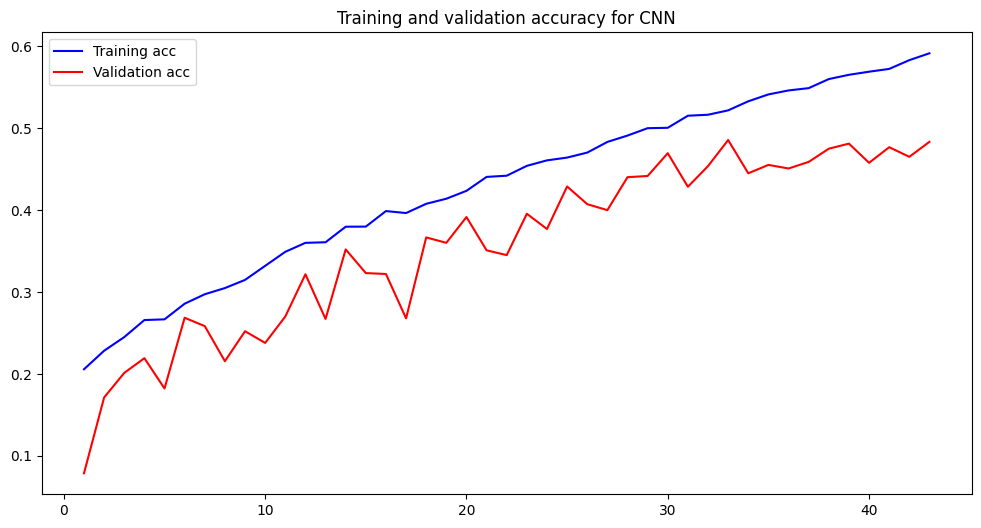

<Figure size 640x480 with 0 Axes>

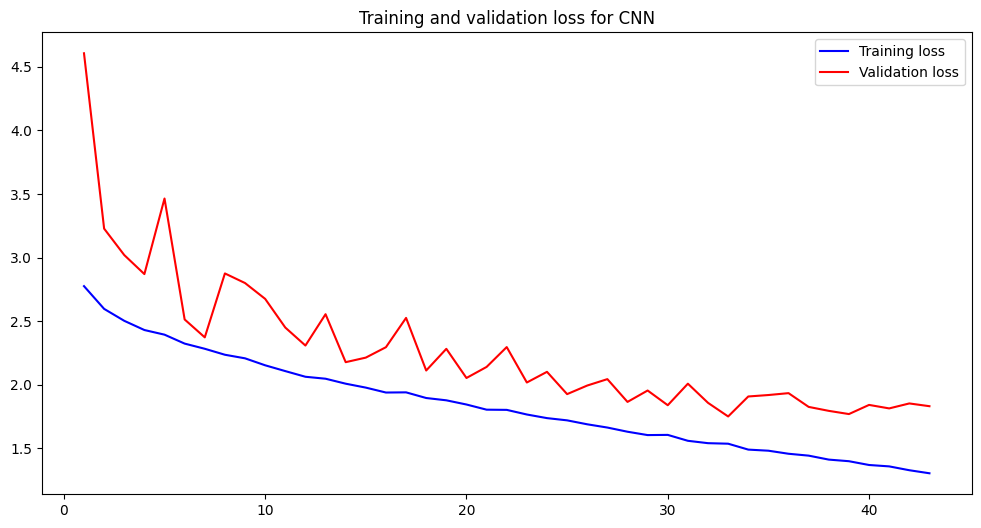

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

In the first epoch, the model achieved a training accuracy of 0.59 and a validation accuracy of 0.48, with a corresponding training loss of 0.43 and a validation loss of 1.83. As training continues, the training accuracy increases, while the validation accuracy fluctuates. The training loss decreases, but the validation loss exhibits some fluctuations.

Overall, the validation accuracy is much lower than the training accuracy, which indicates that the model is overfitting to the training data. The model seems to be improving in the first few epochs, but the improvement slows down as training progresses, and the validation accuracy fails to improve.

##**Depth wise separable and Residual Block**

**The ResNet architecture introduced the residual connection technique in 2015, which adds the input of a layer or block of layers back to its output, allowing the model to bypass the block if it increases training error. This residual link acts as a data shortcut around potentially harmful or noisy blocks, enabling error gradient information from early layers to pass through a deep network without noise.**

**In contrast to regular convolution, a depth-wise separable convolution decomposes a standard convolution into depthwise and pointwise convolutions, making it much more parameter-efficient and computationally efficient while having comparable representational capacity.**

**Keras provides layers for building depth-wise separable convolutions using SeparableConv2D. By replacing Conv2D layers with SeparableConv2D layers that have more parameter efficiency and adding residual connections, CNNs can be made more powerful. Repeating blocks of many convolution layers (not just one) are also commonly used in CNNs, as seen in recent architectures like ResNet and VGGNet.**

In [ ]:
def residual_block(x, filter):

  residual = x
  # x goes through a block consisting of two conv2d+batchnorm+reul as well as a max pooling

  # x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
  x = layers.SeparableConv2D(filters=filter, kernel_size=3, padding="same", use_bias=False )(x)
  x= layers.BatchNormalization()(x)
  x= layers.ReLU()(x)
  x = layers.Dropout(0.2)(x)

  x = layers.SeparableConv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
  x= layers.BatchNormalization()(x)
  x= layers.ReLU()(x)
  x = layers.Dropout(0.2)(x)

  x = layers.SeparableConv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
  x= layers.BatchNormalization()(x)
  x= layers.ReLU()(x)
  x = layers.Dropout(0.2)(x)

  x = layers.SeparableConv2D(filters=filter, kernel_size=3, padding="same", use_bias=False)(x)
  x= layers.BatchNormalization()(x)
  x= layers.ReLU()(x)
  x = layers.Dropout(0.2)(x)

  x = layers.MaxPooling2D(pool_size=2, padding="same")(x)


  # After going through the above block x now has "filter" channels and its feature map is downsampled to half by max pooling
  #so we need to use a 1*1 convolution with stride=2 to downsample residual and change its numebr of channels to "filter".
  residual = layers.Conv2D(filters=filter, kernel_size=1, strides=2, use_bias=False)(residual)

  #Having batchnormalization layer as usual after convolution
  residual= layers.BatchNormalization()(residual)


  x = layers.add([x, residual])
  return x


def build_baseline_residual(input_shape, filters):

  #input layer for getting the input image
  input = keras.Input(shape=input_shape)

  #Add the data_augmentation layers here:
  #x=data_augmentation(input)

  #rescaling layer for rescalign pixels to [0,1] range
  x = layers.experimental.preprocessing.Rescaling(1./255)(input)

  # stack a set of residual blocks
  for filter in filters:
    x= residual_block(x, filter)

  #Global Average pooling. This will get an input of shape (height, width, channels) the average of each feature map and returns a vector of size channels.
  x = layers.GlobalAveragePooling2D()(x)



  #The final output layer has one neuron with sigmoid activation to output the probability of the target class ( cat or dog whichever is labled as one)
  output=layers.Dense(23)(x)

  #create a model and set its input and output and return it
  model = keras.Model(inputs=input, outputs=output)
  return model

baseline_residual=build_baseline_residual(input_shape=(224,224,3), filters=[32,64,128,256, 512])
print(baseline_residual.summary())

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 224, 224, 3)  0           ['input_3[0][0]']                
                                                                                                  
 separable_conv2d (SeparableCon  (None, 224, 224, 32  123        ['rescaling_2[0][0]']            
 v2D)                           )                                                                 
                                                                                            

In [ ]:
#compiling the model

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9)


#callback for early stopping. stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True)

opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
baseline_residual.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)

checkpoint= keras.callbacks.ModelCheckpoint( filepath="drive/MyDrive/fil_dl/baseline_residual_checkpointt",save_best_only=True, monitor="val_loss")

history = baseline_residual.fit(
            train_ds,
            validation_data = val_ds,
            epochs = 50,
            verbose = 1,
            callbacks=[early_stopping, checkpoint])

Epoch 1/50
257/257 [==============================] - ETA: 0s - loss: 2.6594 - accuracy: 0.2248

257/257 [==============================] - 200s 713ms/step - loss: 2.6594 - accuracy: 0.2248 - val_loss: 7.0707 - val_accuracy: 0.0417
Epoch 2/50
257/257 [==============================] - 170s 659ms/step - loss: 2.5022 - accuracy: 0.2506 - val_loss: 7.5510 - val_accuracy: 0.0652
Epoch 3/50
257/257 [==============================] - ETA: 0s - loss: 2.4036 - accuracy: 0.2728

257/257 [==============================] - 181s 705ms/step - loss: 2.4036 - accuracy: 0.2728 - val_loss: 5.4685 - val_accuracy: 0.1255
Epoch 4/50
257/257 [==============================] - ETA: 0s - loss: 2.2895 - accuracy: 0.2971

257/257 [==============================] - 182s 706ms/step - loss: 2.2895 - accuracy: 0.2971 - val_loss: 4.2153 - val_accuracy: 0.1508
Epoch 5/50
257/257 [==============================] - ETA: 0s - loss: 2.1814 - accuracy: 0.3351

257/257 [==============================] - 181s 705ms/step - loss: 2.1814 - accuracy: 0.3351 - val_loss: 4.0084 - val_accuracy: 0.1398
Epoch 6/50
257/257 [==============================] - ETA: 0s - loss: 2.0314 - accuracy: 0.3747

257/257 [==============================] - 181s 704ms/step - loss: 2.0314 - accuracy: 0.3747 - val_loss: 3.8042 - val_accuracy: 0.1746
Epoch 7/50
257/257 [==============================] - ETA: 0s - loss: 1.8882 - accuracy: 0.4200

257/257 [==============================] - 182s 706ms/step - loss: 1.8882 - accuracy: 0.4200 - val_loss: 2.5487 - val_accuracy: 0.2888
Epoch 8/50
257/257 [==============================] - ETA: 0s - loss: 1.7745 - accuracy: 0.4520

257/257 [==============================] - 182s 706ms/step - loss: 1.7745 - accuracy: 0.4520 - val_loss: 2.5300 - val_accuracy: 0.3152
Epoch 9/50
257/257 [==============================] - ETA: 0s - loss: 1.6608 - accuracy: 0.4935

257/257 [==============================] - 181s 703ms/step - loss: 1.6608 - accuracy: 0.4935 - val_loss: 2.5197 - val_accuracy: 0.3393
Epoch 10/50
257/257 [==============================] - ETA: 0s - loss: 1.5646 - accuracy: 0.5141

257/257 [==============================] - 181s 703ms/step - loss: 1.5646 - accuracy: 0.5141 - val_loss: 2.3714 - val_accuracy: 0.3554
Epoch 11/50
257/257 [==============================] - ETA: 0s - loss: 1.4638 - accuracy: 0.5443

257/257 [==============================] - 182s 706ms/step - loss: 1.4638 - accuracy: 0.5443 - val_loss: 2.0253 - val_accuracy: 0.3924
Epoch 12/50
257/257 [==============================] - 170s 660ms/step - loss: 1.3737 - accuracy: 0.5732 - val_loss: 2.0675 - val_accuracy: 0.4125
Epoch 13/50
257/257 [==============================] - 169s 659ms/step - loss: 1.2937 - accuracy: 0.5975 - val_loss: 2.2095 - val_accuracy: 0.3540
Epoch 14/50
257/257 [==============================] - 168s 655ms/step - loss: 1.2385 - accuracy: 0.6158 - val_loss: 2.4545 - val_accuracy: 0.3272
Epoch 15/50
257/257 [==============================] - 170s 659ms/step - loss: 1.1435 - accuracy: 0.6441 - val_loss: 2.0344 - val_accuracy: 0.4158
Epoch 16/50
257/257 [==============================] - 170s 659ms/step - loss: 1.0687 - accuracy: 0.6618 - val_loss: 2.0846 - val_accuracy: 0.3993
Epoch 17/50
257/257 [==============================] - 169s 658ms/step - loss: 0.9902 - accuracy: 0.6856 - val_loss: 2.4244 - val_

Depth-wise separable convolution is a technique used in deep learning to reduce the number of parameters in a convolutional neural network (CNN) by decomposing the standard convolution operation into two simpler operations: depth-wise convolution and point-wise convolution. This results in a more computationally efficient network while maintaining the accuracy of the model.

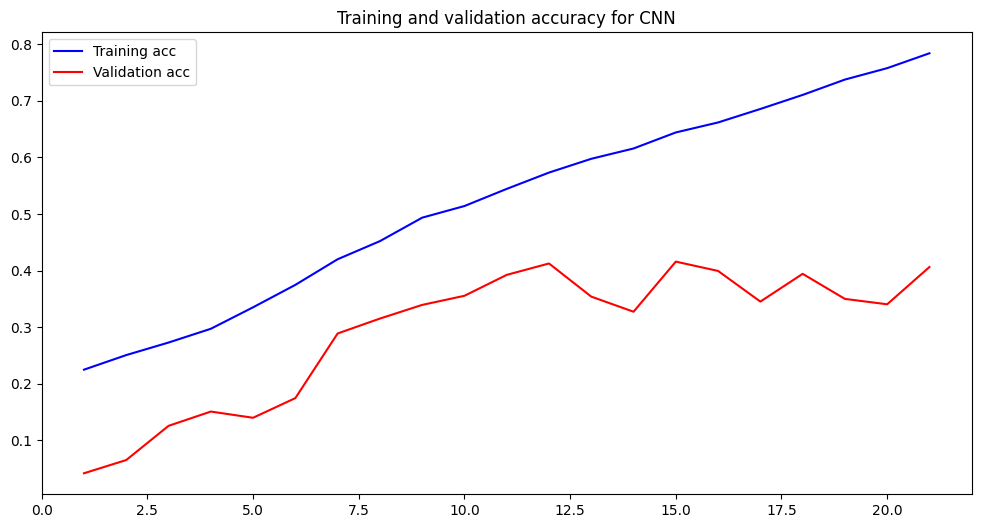

<Figure size 640x480 with 0 Axes>

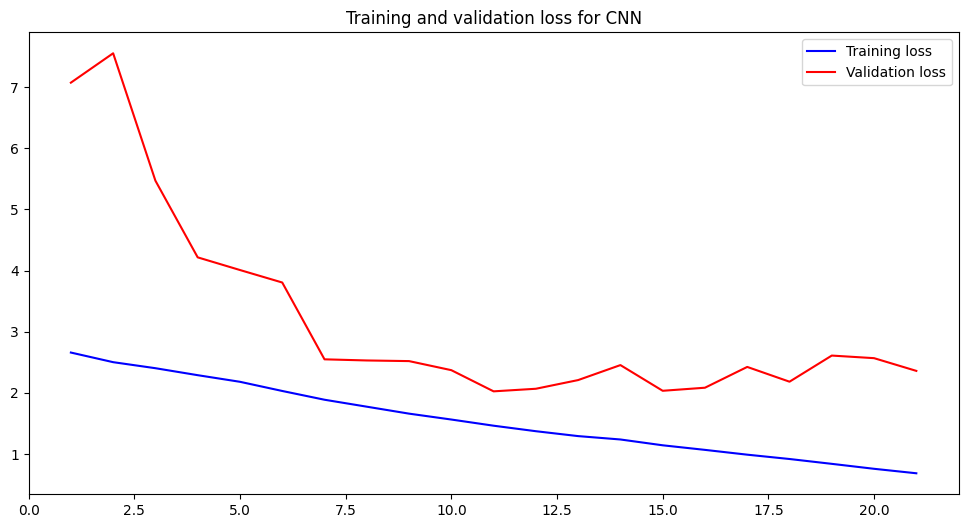

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

## **Transfer Learning using Feature Extraction**

**Using a pretrained network is a common and highly effective approach to deep learning when working with small image datasets. A pretrained network is one that has been previously trained on a large dataset, typically for a large-scale image classification task. If the original dataset is sufficiently large and diverse, the hierarchical features learned by the pretrained network can serve as a generic model of the visual world, and these features can be useful for a wide range of computer vision problems, even if the new problems involve completely different classes than the original task.**

**One common technique for using a pretrained network is feature extraction. This involves taking the convolutional base (i.e., the convolutional layers and possibly batch normalization layers) of a well-known architecture (such as VGG, ResNet, Inception, DenseNet, etc.) that has been pretrained on ImageNet, running the new dataset through it to extract features, and then training a new classifier using these extracted features.**

In [ ]:
#instantiate a DenseNet121 model trained on ImageNet dataset
from tensorflow.keras.applications import DenseNet169
conv_base = DenseNet169(weights='imagenet',
include_top=False,
input_shape=(224, 224, 3))

#freeze the weight of the convolutional base
conv_base.trainable=False

# get the summary of the model to view its architecture
conv_base.summary()

51877672/51877672 [==============================] - 2s 0us/step
Model: "densenet169"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                       

In [ ]:
def build_pretrained(input_shape):

  #Configuring the model architecture

  #input layer for getting the input image
  input = keras.Input(shape=input_shape)

  #Using the pre-trained conv_base
  x = conv_base(input)

  #Global Average pooling. This will get an input of shape (height, width, channels) the average of each feature map and returns a vector of size channels.
  x = layers.GlobalAveragePooling2D()(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #create a model and set its input and output and return it
  model = keras.Model(inputs=input, outputs=output)
  return model

pretrained_model=build_pretrained(input_shape=(224, 224, 3))
print(pretrained_model.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 densenet169 (Functional)    (None, 7, 7, 1664)        12642880  
                                                                 
 global_average_pooling2d_3   (None, 1664)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_5 (Dense)             (None, 23)                38295     
                                                                 
Total params: 12,681,175
Trainable params: 38,295
Non-trainable params: 12,642,880
_________________________________________________________________
None


In [ ]:
#compiling the model

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9)

#callback for early stopping. stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True)

opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
pretrained_model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)


history = pretrained_model.fit(
            train_ds,
            validation_data = val_ds,
            epochs = 50,
            verbose = 1,
            callbacks=[early_stopping])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


257/257 [==============================] - 59s 185ms/step - loss: 4.4144 - accuracy: 0.2613 - val_loss: 3.6469 - val_accuracy: 0.3001
Epoch 2/50
257/257 [==============================] - 40s 154ms/step - loss: 2.9551 - accuracy: 0.3609 - val_loss: 3.5677 - val_accuracy: 0.2990
Epoch 3/50
257/257 [==============================] - 40s 155ms/step - loss: 2.7108 - accuracy: 0.3954 - val_loss: 3.6919 - val_accuracy: 0.3313
Epoch 4/50
257/257 [==============================] - 40s 155ms/step - loss: 2.4725 - accuracy: 0.4170 - val_loss: 3.0823 - val_accuracy: 0.3269
Epoch 5/50
257/257 [==============================] - 40s 154ms/step - loss: 2.2285 - accuracy: 0.4539 - val_loss: 3.1724 - val_accuracy: 0.3382
Epoch 6/50
257/257 [==============================] - 40s 155ms/step - loss: 2.1195 - accuracy: 0.4662 - val_loss: 2.8053 - val_accuracy: 0.3898
Epoch 7/50
257/257 [==============================] - 40s 154ms/step - loss: 1.9809 - accuracy: 0.4886 - val_loss: 3.0117 - val_accuracy: 0.3

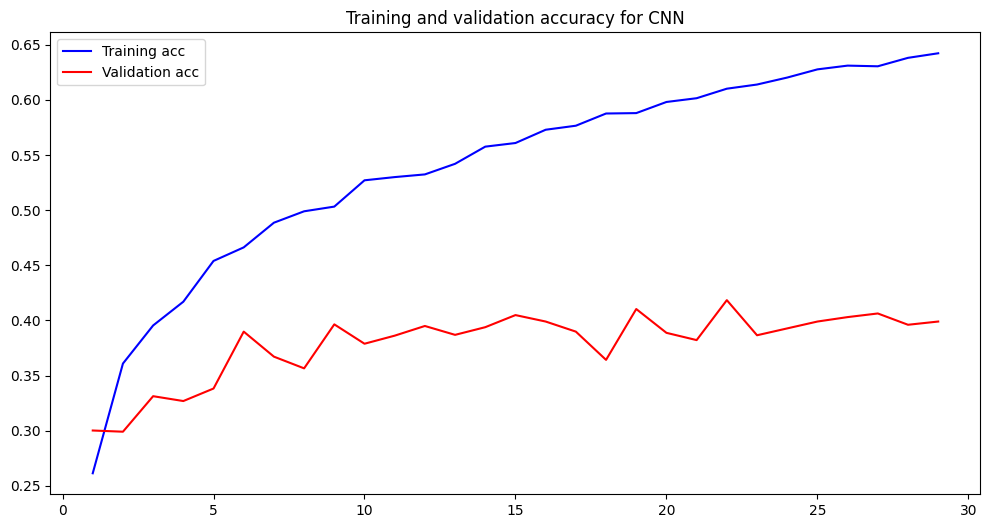

<Figure size 640x480 with 0 Axes>

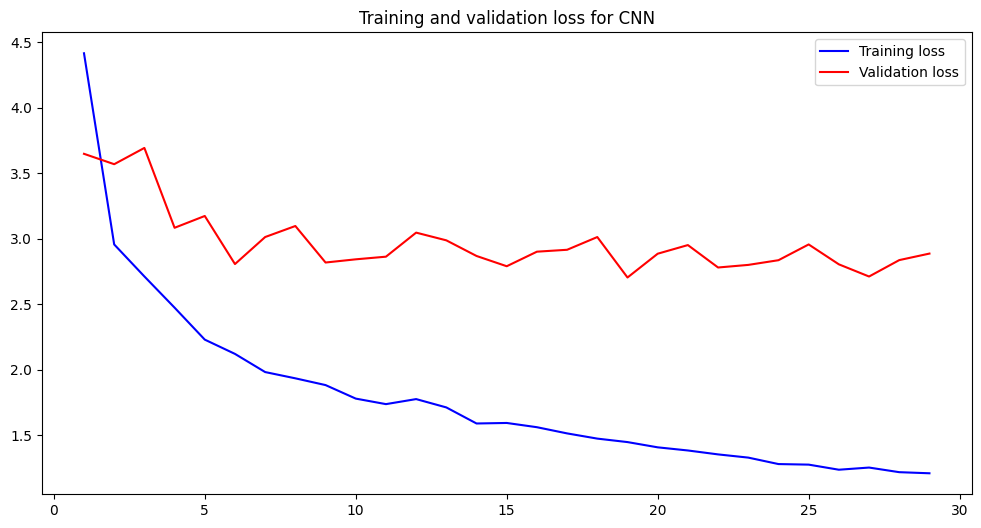

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

##**Transfer Learning Using ResNet101**

**Using transfer learning with ResNet101 involves taking the pre-trained ResNet101 model and removing the top layers (typically the fully connected layers) that were trained on ImageNet, a large-scale dataset of images with over 1,000 classes. The remaining layers of ResNet101 are then used as a convolutional feature extractor for the new task.**

**The next step is to add new layers to the model, which will be trained on the new dataset. The number of new layers and their architecture depend on the specific task. For example, if the new task is image classification, a few fully connected layers are added, followed by a softmax layer for outputting the predicted class probabilities.**

**Transfer learning using ResNet101 has several benefits. First, the pre-trained ResNet101 model already learned a lot of useful features from the ImageNet dataset, so it requires less training time and data to achieve good performance on the new task. Second, ResNet101 is a very deep and complex architecture that can learn complex and abstract features from images, making it suitable for a wide range of computer vision tasks.**


In [ ]:

resnet = tf.keras.applications.resnet.ResNet101(
    include_top=False,
    weights='imagenet',
    #input_tensor=,
    input_shape=(224,224,3),
    pooling=None,
    classes=1000,
    #**kwargs
)

print(resnet.summary())

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

In [ ]:


def build_pretrained(input_shape):

  #Configuring the model architecture

  #input layer for getting the input image
  input = keras.Input(shape=input_shape)

  #Using the pre-trained conv_base
  x = resnet(input)

  #Global Average pooling. This will get an input of shape (height, width, channels) the average of each feature map and returns a vector of size channels.
  x = layers.GlobalAveragePooling2D()(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #The final output layer has one neuron with softmax activation
  output=layers.Dense(23, activation='softmax')(x)

  #create a model and set its input and output and return it
  model = keras.Model(inputs=input, outputs=output)
  return model

pretrained_model=build_pretrained(input_shape=(224, 224, 3))
print(pretrained_model.summary())






Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, 7, 7, 2048)        42658176  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 23)                47127     
                                                                 
Total params: 42,705,303
Trainable params: 42,599,959
Non-trainable params: 105,344
_________________________________________________________________
None


In [ ]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9)

#callback for early stopping. stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True)

opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
pretrained_model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)


history = pretrained_model.fit(
            train_ds,
            validation_data = val_ds,
            epochs = 20,
            verbose = 1,
            callbacks=[early_stopping])

Epoch 1/20
257/257 [==============================] - 21s 52ms/step - loss: 0.8138 - accuracy: 0.7575 - val_loss: 1.0638 - val_accuracy: 0.7350
Epoch 2/20
257/257 [==============================] - 11s 42ms/step - loss: 0.3483 - accuracy: 0.8922 - val_loss: 1.1085 - val_accuracy: 0.7423
Epoch 3/20
257/257 [==============================] - 11s 42ms/step - loss: 0.1698 - accuracy: 0.9566 - val_loss: 1.1823 - val_accuracy: 0.7335
Epoch 4/20
257/257 [==============================] - 11s 42ms/step - loss: 0.1108 - accuracy: 0.9710 - val_loss: 1.1782 - val_accuracy: 0.7518
Epoch 5/20
257/257 [==============================] - 11s 42ms/step - loss: 0.0692 - accuracy: 0.9854 - val_loss: 1.1775 - val_accuracy: 0.7584
Epoch 6/20
257/257 [==============================] - 11s 42ms/step - loss: 0.0522 - accuracy: 0.9865 - val_loss: 1.2498 - val_accuracy: 0.7584
Epoch 7/20
257/257 [==============================] - 11s 42ms/step - loss: 0.0417 - accuracy: 0.9890 - val_loss: 1.2332 - val_accuracy:

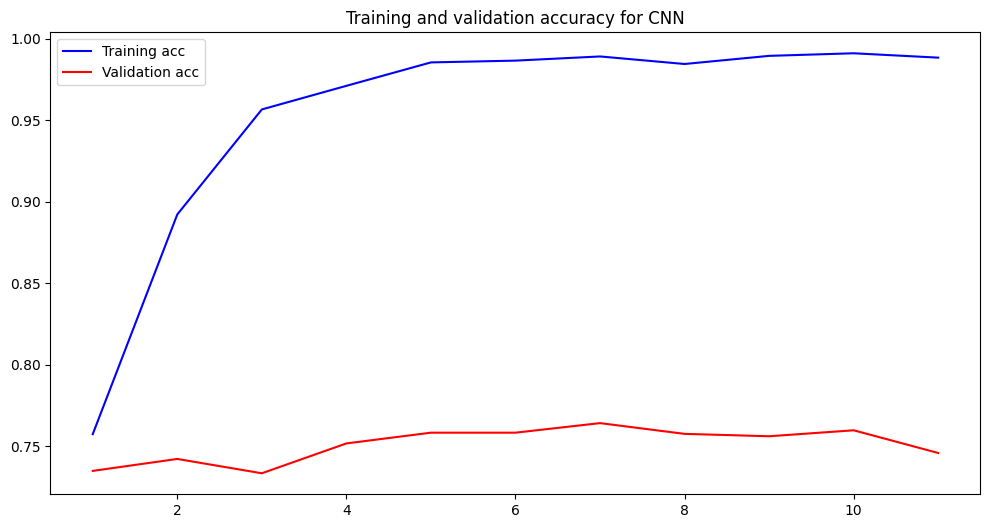

<Figure size 640x480 with 0 Axes>

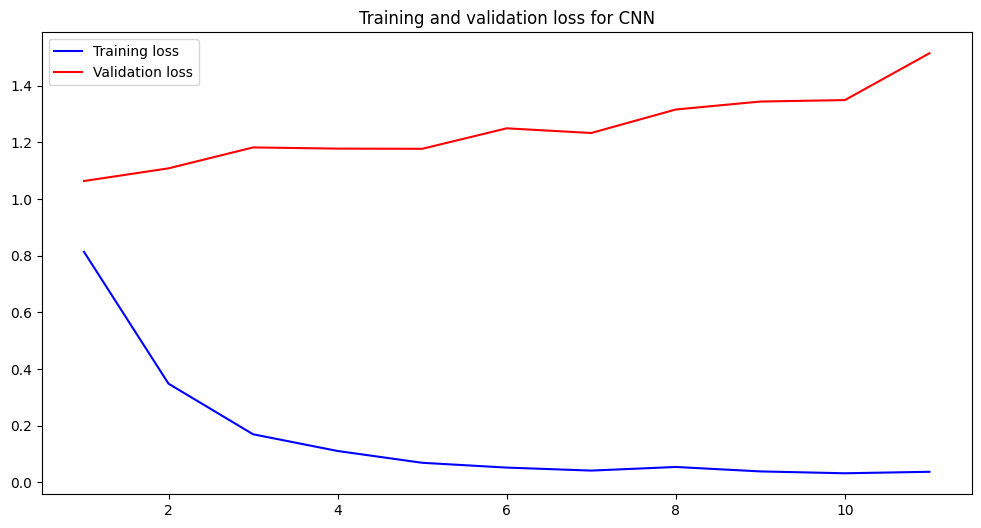

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

## **Fine Tuning**

**The code is a of fine-tuning a pre-trained convolutional neural network called conv_base. Fine-tuning involves unfreezing some layers of the pre-trained model and training them on a new dataset to improve its performance on a specific task.**

In [ ]:
#unfreez the convolution base
resnet.trainable = True

#set trainable to False for all layers except the last 9 , that is freeze the weights for all layers except the last 9 layers
for layer in resnet.layers[:-9]:
    layer.trainable=False

#set trainable to True for the convolutional layhers in the last 9 layers ( the last convolutional block in DENSENET121).
for layer in resnet.layers[-9:]:
    # we only want to unfreez the convolutional layers (batch normalizataion layers remain frozen)
    if layer.name.endswith("conv"):
      layer.trainable=True

print(pretrained_model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, 7, 7, 2048)        42658176  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 23)                47127     
                                                                 
Total params: 42,705,303
Trainable params: 3,463,703
Non-trainable params: 39,241,600
_________________________________________________________________
None


In [ ]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9)

#callback for early stopping. stop the training if the validation_loss does not improve after 10 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True)

#compiling the model
opt = tf.keras.optimizers.Adam(learning_rate=1e-5)
pretrained_model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'], optimizer=opt)

history = pretrained_model.fit(
            train_ds,
            validation_data = val_ds,
            epochs = 20,
            verbose = 1,
            callbacks=[early_stopping])

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


257/257 [==============================] - 123s 438ms/step - loss: 3.1485 - accuracy: 0.1590 - val_loss: 2.4239 - val_accuracy: 0.3243
Epoch 2/20
257/257 [==============================] - 11s 43ms/step - loss: 2.0450 - accuracy: 0.4359 - val_loss: 1.7862 - val_accuracy: 0.4923
Epoch 3/20
257/257 [==============================] - 11s 43ms/step - loss: 1.5452 - accuracy: 0.5706 - val_loss: 1.4848 - val_accuracy: 0.5787
Epoch 4/20
257/257 [==============================] - 11s 43ms/step - loss: 1.2753 - accuracy: 0.6503 - val_loss: 1.3077 - val_accuracy: 0.6373
Epoch 5/20
257/257 [==============================] - 11s 43ms/step - loss: 1.0934 - accuracy: 0.7042 - val_loss: 1.1964 - val_accuracy: 0.6684
Epoch 6/20
257/257 [==============================] - 11s 43ms/step - loss: 0.9696 - accuracy: 0.7367 - val_loss: 1.1202 - val_accuracy: 0.6889
Epoch 7/20
257/257 [==============================] - 11s 43ms/step - loss: 0.8786 - accuracy: 0.7631 - val_loss: 1.0638 - val_accuracy: 0.7064
E

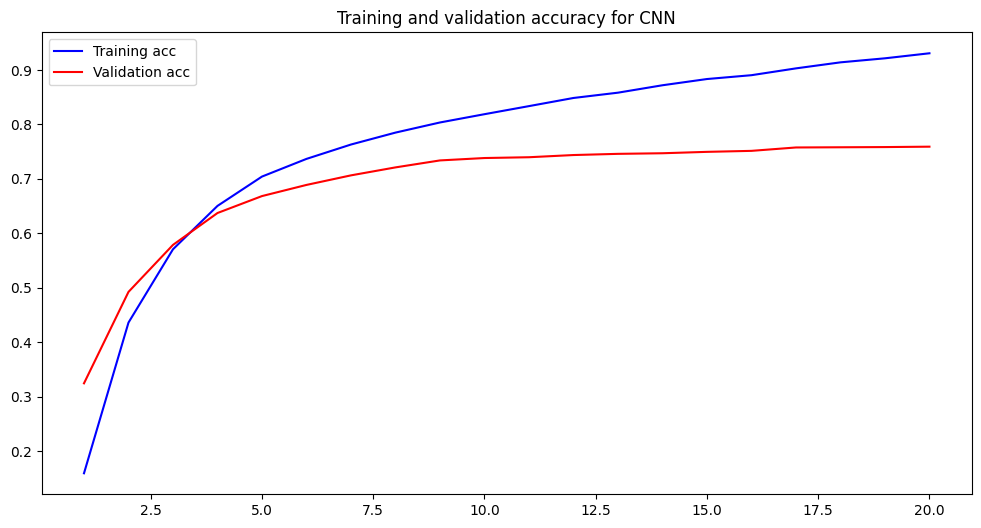

<Figure size 640x480 with 0 Axes>

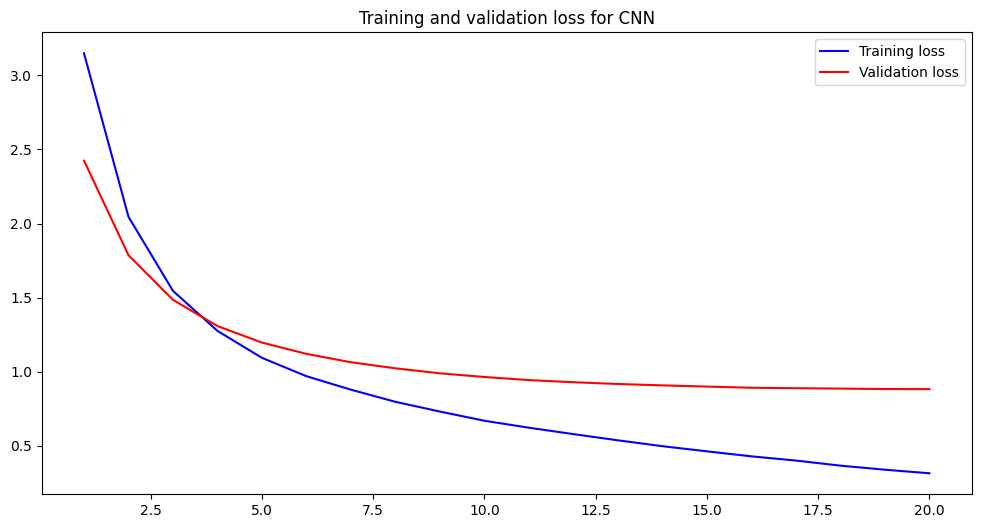

In [ ]:
#Function to plot model's validation loss and validation accuracy
def plot_model_accuracy_loss(history):
    plt.figure(figsize=(12,6))

    #getting train and validation accuracies
    train_acc_CNN = history.history['accuracy']
    val_acc_CNN = history.history['val_accuracy']

    #getting train and validation losses
    train_loss_CNN = history.history['loss']
    val_loss_CNN = history.history['val_loss']
    epochs = range(1, len(train_loss_CNN) + 1)

    #plotting the training and validation accurracies
    plt.plot(epochs, train_acc_CNN, 'b', label='Training acc')
    plt.plot(epochs, val_acc_CNN, 'r', label='Validation acc')
    plt.title('Training and validation accuracy for CNN')
    plt.legend()
    plt.figure()

    plt.figure(figsize=(12,6))

    #plotting the train and validaiton losses
    plt.plot(epochs, train_loss_CNN, 'b', label='Training loss')
    plt.plot(epochs, val_loss_CNN, 'r', label='Validation loss')
    plt.title('Training and validation loss for CNN')

    plt.legend()
    plt.show()

#getting train and validation accuracies
plot_model_accuracy_loss(history)

The training process seems to be going well. The model achieved a high accuracy of 0.9215 on the training set and 0.7584 on the validation set after 20 epochs, indicating that it learned to generalize well to unseen data. The loss also decreased significantly over the epochs.

## **Evaluate Model and Analyse Results**

## **Computing the accuracy on the test data**

In [ ]:
#compute the loss and accurracy on the test set using model.evaluate method
test_loss, test_acc = pretrained_model.evaluate(test_ds)
print('test acc:', test_acc)

87/87 [==============================] - 235s 3s/step - loss: 1.1453 - accuracy: 0.6938
test acc: 0.6938405632972717


The test accuracy of the model is 0.6938.

##**Showing misclassified images in the validation data**

1/1 [==============================] - 2s 2s/step
True label is: 3, CNN predicted 21 with confidence [0.03250502 0.01150761 0.00188076 0.04818197 0.06513403 0.01085794
 0.02237891 0.00278135 0.00612808 0.02962781 0.00564405 0.13360114
 0.0018692  0.01027645 0.00080402 0.02442621 0.04471769 0.23879127
 0.00420191 0.0032314  0.00500217 0.2876479  0.00880314]


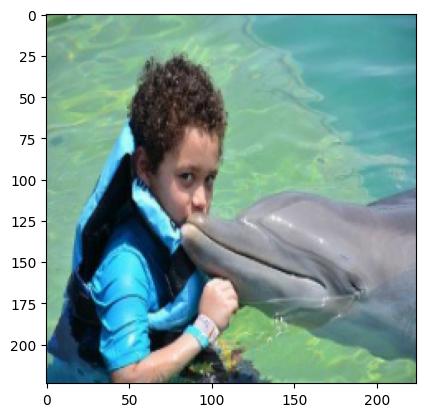

True label is: 0, CNN predicted 8 with confidence [4.0788692e-01 8.6128450e-05 4.8396714e-06 4.1538849e-05 3.1930811e-03
 6.6288072e-04 6.4625591e-03 6.2710507e-04 5.6735361e-01 6.9174755e-05
 7.2499461e-06 3.8856026e-05 1.5220629e-03 3.0833889e-05 1.5271474e-06
 6.8107399e-04 1.7802044e-05 5.3186053e-03 1.6477850e-03 7.1199995e-04
 3.0900774e-05 2.8835309e-03 7.1993185e-04]


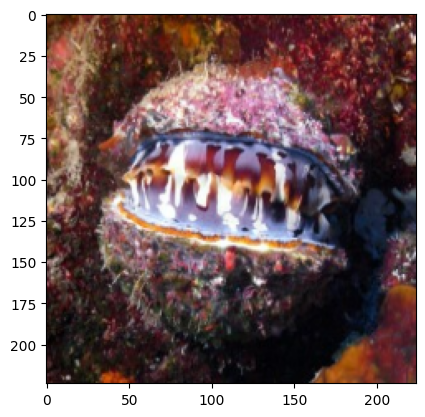

True label is: 6, CNN predicted 21 with confidence [3.4714092e-02 3.5222091e-03 3.9323196e-02 1.6953991e-04 1.2655436e-01
 5.0295652e-03 6.9573205e-03 1.9576973e-03 2.4367640e-02 2.0680518e-01
 8.8602182e-04 2.2263177e-02 3.0903073e-02 8.4955413e-03 1.8758217e-03
 1.1030809e-02 1.8206279e-03 4.1723922e-03 1.4251997e-02 2.7571144e-02
 4.6102935e-03 4.1782221e-01 4.8960806e-03]


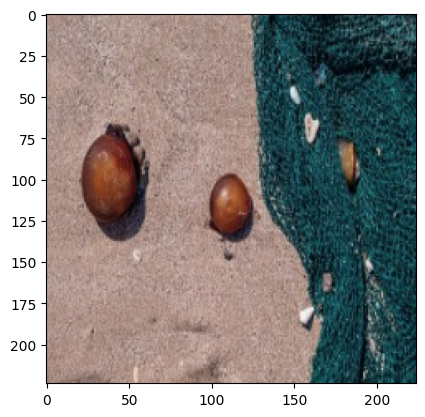

True label is: 18, CNN predicted 7 with confidence [8.9284341e-04 8.4672167e-05 1.9300312e-03 7.7794080e-05 3.2744117e-04
 2.2645062e-02 6.0147988e-05 9.1141796e-01 1.0916591e-03 1.7998355e-03
 1.4326717e-05 7.0709456e-04 2.1767263e-04 7.8116595e-05 2.1103482e-05
 2.2136718e-03 5.8341200e-05 4.2052998e-04 5.3730346e-02 8.8525336e-04
 3.0877873e-05 1.2777566e-03 1.7427690e-05]


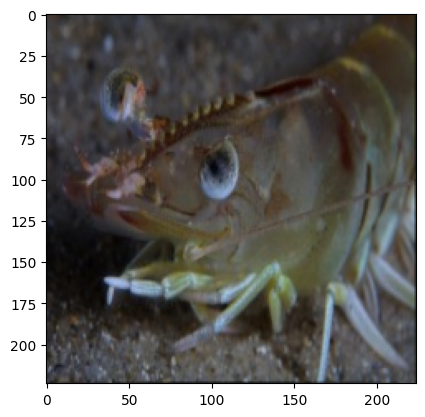

True label is: 22, CNN predicted 21 with confidence [0.02395065 0.00610426 0.00698974 0.12781596 0.06003984 0.01722866
 0.00296017 0.01090115 0.00956239 0.03320485 0.00570562 0.01085559
 0.0041377  0.15328169 0.00050464 0.05035328 0.03193115 0.13728508
 0.00497555 0.02012314 0.0049278  0.25050825 0.02665278]


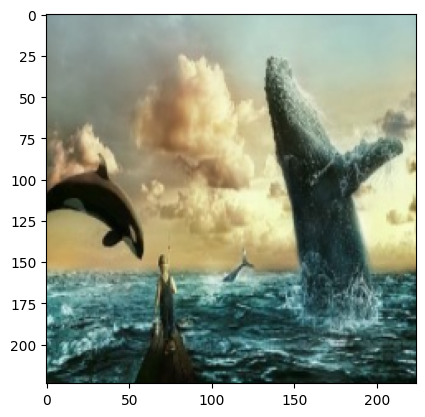

True label is: 18, CNN predicted 1 with confidence [6.7260506e-04 9.8549169e-01 1.4490534e-05 7.5501266e-05 2.9046950e-04
 8.1111200e-04 3.5415564e-05 8.6413093e-05 4.4503608e-03 1.7326394e-03
 1.3176724e-04 1.6785254e-05 6.4433858e-05 2.4434305e-05 2.3379109e-06
 2.3904643e-03 1.3959511e-05 5.0238477e-06 3.4235809e-03 1.1826869e-04
 7.5244148e-05 6.7611873e-05 5.3598519e-06]


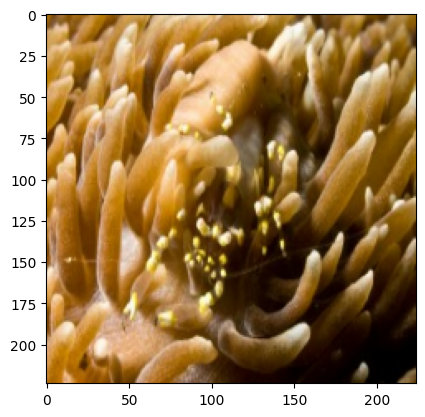

True label is: 3, CNN predicted 21 with confidence [2.3484221e-05 5.1834439e-07 1.4656034e-07 2.2186459e-05 2.8445384e-05
 4.5630972e-07 1.5100380e-04 2.9094751e-06 1.8028795e-05 5.2324554e-05
 3.5984231e-05 5.6075619e-04 3.3970185e-08 1.3664890e-03 1.4269909e-07
 4.9149240e-03 1.8184941e-04 4.1277493e-05 6.2388381e-06 4.0063664e-04
 7.7228715e-06 9.9169934e-01 4.8517948e-04]


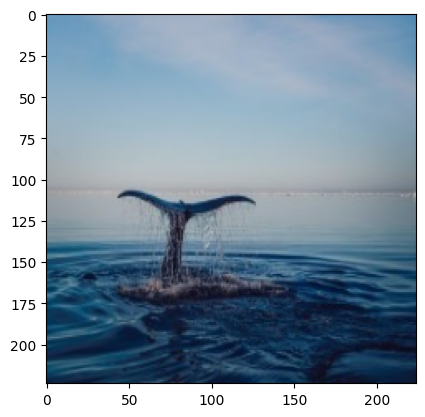

True label is: 13, CNN predicted 21 with confidence [2.0453766e-02 3.6021601e-04 2.8247832e-04 6.8883033e-04 2.4559107e-02
 9.1834012e-03 4.6717265e-04 1.9730071e-03 7.9794117e-04 3.4901101e-02
 1.7771885e-03 2.0675978e-03 1.3258735e-03 2.5186771e-01 5.8721966e-05
 3.9329263e-03 3.8126591e-03 1.6852992e-02 2.9260663e-03 7.3805209e-03
 7.7882345e-04 6.0879022e-01 4.7616377e-03]


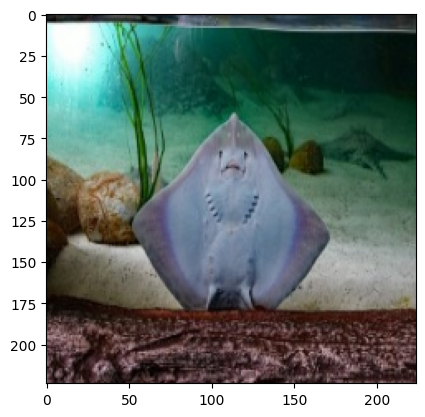

True label is: 3, CNN predicted 21 with confidence [0.0126     0.01033622 0.00201596 0.00771422 0.00235881 0.01404735
 0.00336255 0.01590104 0.00338397 0.018852   0.00701951 0.02538693
 0.00475282 0.03741529 0.00139551 0.0084696  0.00231072 0.00652901
 0.05508828 0.00397364 0.00642773 0.7453828  0.00527607]


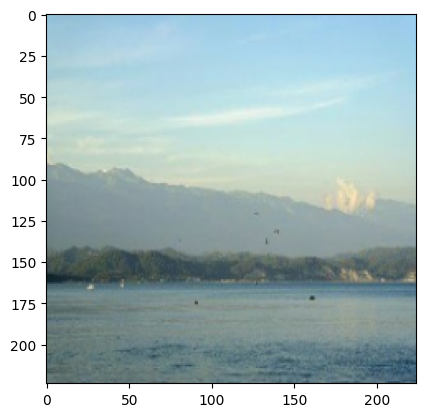

1/1 [==============================] - 0s 35ms/step
True label is: 19, CNN predicted 0 with confidence [2.8311294e-01 2.1514004e-02 1.6669401e-03 2.0808256e-03 3.1598534e-02
 2.0482349e-01 6.3176482e-04 2.7207905e-02 6.1949180e-03 3.0958135e-02
 8.5483312e-05 1.0601649e-02 3.0399064e-02 1.6522069e-02 4.7882567e-03
 3.1933829e-03 3.6955306e-03 1.9150606e-01 2.1491809e-02 1.0135023e-01
 5.5519026e-03 1.2374428e-04 9.0131629e-04]


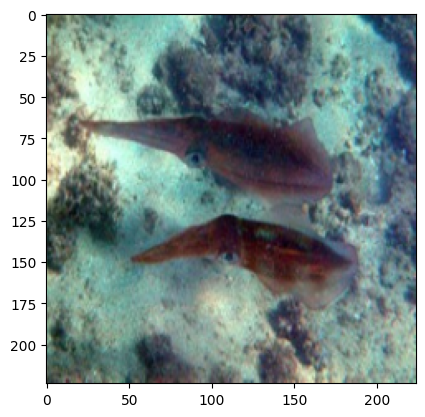

True label is: 8, CNN predicted 9 with confidence [2.5147300e-02 9.1868656e-04 9.8244892e-04 1.7637007e-04 8.0272451e-04
 1.4592875e-04 4.4677025e-04 5.2759177e-03 2.9766840e-01 4.9363366e-01
 1.1138552e-03 5.1272998e-04 9.4456106e-02 9.8847365e-03 9.7423050e-05
 4.3826476e-02 3.7054546e-04 7.9566607e-04 9.4034011e-03 4.9905460e-03
 3.3505023e-03 5.9178756e-03 8.2009799e-05]


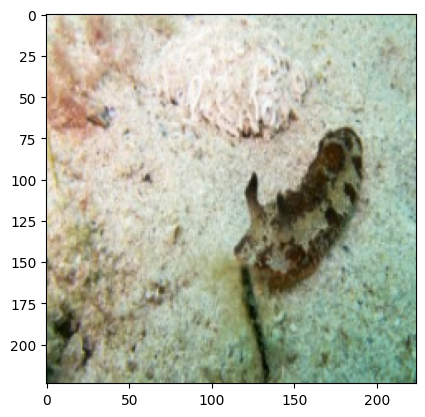

True label is: 18, CNN predicted 8 with confidence [3.62299457e-02 3.32782753e-02 9.99195967e-03 8.20391288e-04
 3.17866504e-02 1.18368175e-02 8.23790382e-04 1.23754926e-01
 3.80991817e-01 1.12374701e-01 3.48745933e-04 3.04331491e-03
 7.74795655e-03 7.24313734e-03 3.86237539e-03 2.60755681e-02
 6.47187466e-03 9.92511678e-03 1.62266463e-01 2.08037794e-02
 6.24586409e-03 2.99676554e-03 1.07968005e-03]


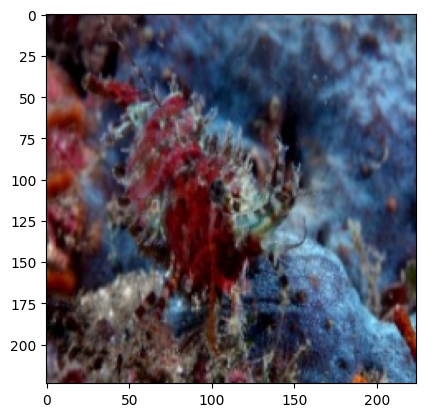

True label is: 21, CNN predicted 15 with confidence [6.5994810e-04 1.4191350e-02 3.1560764e-04 1.3753988e-03 3.2247957e-02
 4.6943020e-02 1.8859759e-02 5.1841757e-04 7.3518460e-03 5.2271429e-03
 7.0138776e-04 2.4520993e-02 9.1132652e-03 5.6408015e-03 5.2880518e-05
 3.0602509e-01 5.7133362e-02 8.6204328e-02 5.4005897e-03 1.7371507e-01
 3.3054032e-04 1.9180112e-01 1.1670066e-02]


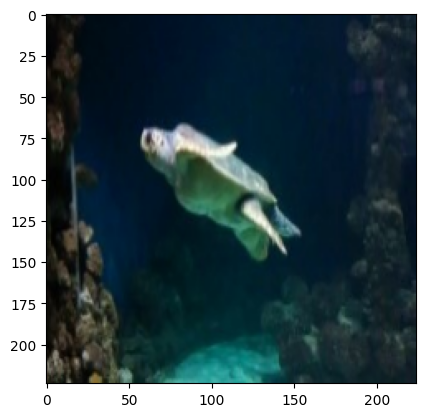

True label is: 9, CNN predicted 18 with confidence [1.4648226e-03 2.5866225e-03 3.9846954e-04 9.2366310e-05 1.5247842e-04
 7.7062198e-03 1.5833655e-03 2.8199062e-02 2.0739615e-03 4.6586629e-04
 1.5388863e-02 1.5008089e-02 7.9597521e-04 5.5950490e-04 6.3470419e-04
 2.0897230e-02 7.4893946e-04 1.5251704e-03 6.5586287e-01 2.6236975e-03
 1.9130806e-04 2.3846827e-01 2.5721486e-03]


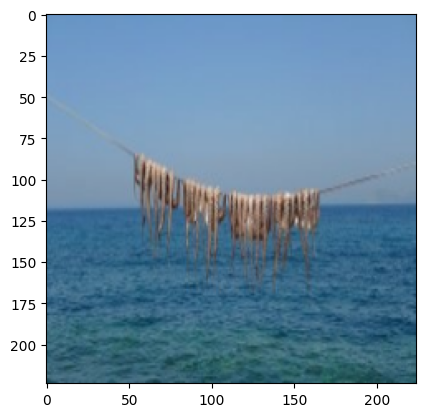

True label is: 8, CNN predicted 13 with confidence [1.4755977e-02 3.6842115e-02 8.8060871e-03 1.9340225e-02 2.2334738e-02
 8.3835488e-03 1.0873541e-03 2.5007162e-02 4.3776436e-03 3.1241890e-02
 7.0356240e-04 7.9335356e-03 2.8968898e-03 6.7644328e-01 1.1532690e-04
 2.4768773e-02 1.5230562e-02 2.4983915e-02 8.4889177e-03 1.9429103e-02
 4.4165217e-04 4.1653495e-04 4.5971230e-02]


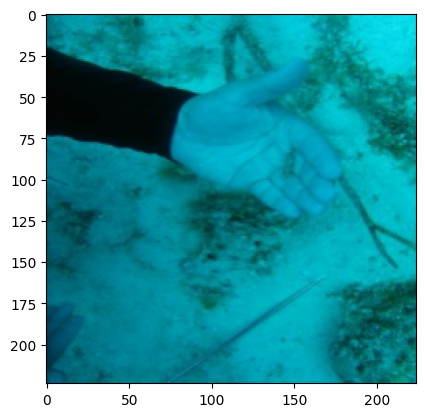

True label is: 17, CNN predicted 13 with confidence [2.72214311e-05 1.32362975e-05 3.06057627e-05 7.35056475e-02
 2.33065857e-05 1.07286491e-04 6.60728911e-05 7.90280410e-06
 7.94193038e-05 1.96586961e-06 4.34262938e-06 5.60087938e-05
 8.59869397e-06 8.83733332e-01 3.64487477e-07 2.52720842e-04
 5.47348900e-05 4.01527844e-02 4.30680939e-06 1.83402677e-04
 1.88918239e-05 2.37713539e-06 1.66541466e-03]


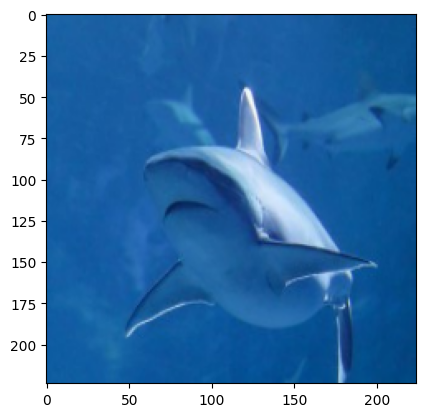

True label is: 18, CNN predicted 8 with confidence [1.76738575e-02 1.20859835e-02 1.07207999e-03 2.87554431e-04
 1.23349972e-01 1.15934024e-02 1.10131521e-04 1.97392353e-03
 3.23258221e-01 3.49681675e-02 8.18874687e-05 7.37171678e-04
 3.40049490e-02 1.97652401e-03 2.51912017e-04 2.34196289e-03
 1.68107753e-03 1.15547916e-02 2.71974087e-01 1.38924718e-01
 5.18616382e-03 1.35176629e-03 3.55968811e-03]


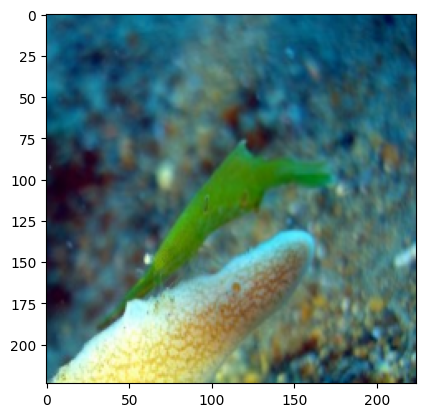

True label is: 12, CNN predicted 21 with confidence [7.9025459e-03 7.8217080e-04 5.5136683e-04 3.6167209e-03 2.2421209e-03
 5.0368045e-02 8.9287311e-03 1.1955168e-03 1.0567118e-03 5.8163987e-03
 3.6136918e-02 1.1241097e-02 1.7865494e-01 4.5726329e-02 6.3001254e-04
 2.2724876e-02 1.8581497e-02 3.0724637e-02 8.4266691e-03 1.8737221e-03
 3.2606663e-04 5.1189065e-01 5.0602205e-02]


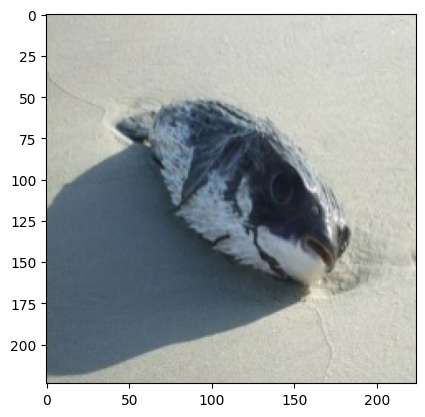

True label is: 20, CNN predicted 9 with confidence [5.79718687e-02 1.49783000e-01 1.87064958e-04 1.37453229e-04
 5.68440929e-02 5.86984074e-03 1.48374675e-04 1.19319176e-02
 4.12962101e-02 3.66377860e-01 8.52522790e-05 1.31419837e-03
 1.20838415e-02 2.00751610e-03 5.07101277e-03 1.37230298e-02
 7.30750662e-06 3.80627299e-03 1.88168347e-01 7.65797356e-03
 7.15738162e-02 3.45080183e-03 5.02933108e-04]


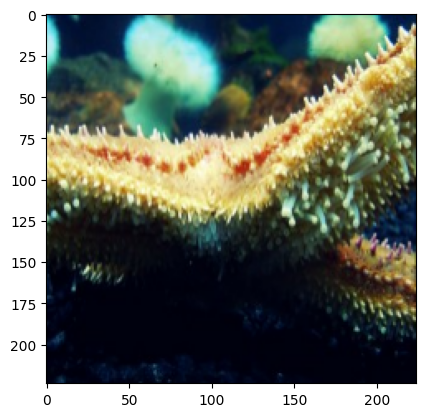

1/1 [==============================] - 0s 35ms/step
True label is: 9, CNN predicted 8 with confidence [3.4823786e-02 2.4536862e-03 3.3642808e-03 9.0117348e-05 1.4284601e-02
 1.2433532e-01 2.4239714e-03 1.4524483e-02 5.5740768e-01 1.3052275e-02
 3.0667405e-05 6.6996360e-04 1.3794149e-02 1.5940394e-03 4.3769542e-04
 3.4940059e-03 6.7216449e-04 8.6483086e-04 2.0308577e-01 5.7297596e-03
 1.8012439e-03 8.3533238e-04 2.3021884e-04]


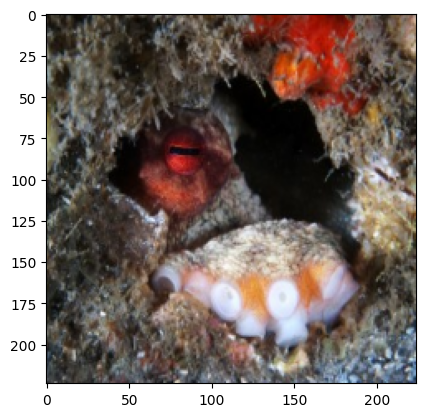

True label is: 9, CNN predicted 21 with confidence [6.8658772e-03 5.7053263e-03 1.2014394e-04 3.2712605e-03 2.2009015e-03
 1.2593258e-03 2.9874474e-01 2.2315485e-03 3.2537978e-04 3.0363866e-04
 3.8728310e-04 1.0156377e-02 1.4814107e-04 2.1391148e-03 1.3733115e-03
 1.4566110e-01 1.4323532e-04 4.0057050e-03 2.0810927e-03 1.5062533e-02
 2.5183454e-03 4.9114653e-01 4.1491007e-03]


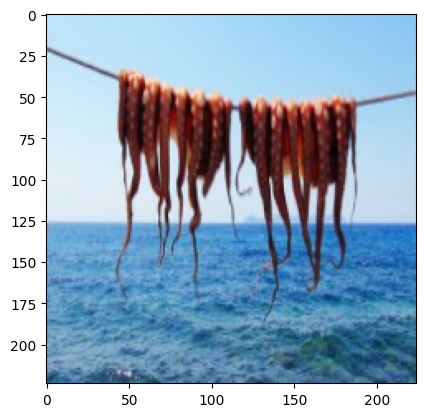

True label is: 22, CNN predicted 11 with confidence [2.2147964e-05 3.0009349e-05 1.3563599e-04 1.0633209e-03 1.1582929e-03
 1.8221356e-03 5.9695805e-05 5.9158815e-04 5.4302818e-05 3.8692247e-05
 6.7487825e-04 9.2101729e-01 8.3288905e-05 6.8011172e-03 5.9966322e-05
 3.7223643e-03 1.1386464e-03 6.7466876e-04 3.1501986e-04 1.6290123e-04
 8.7105072e-05 4.7082890e-02 1.3204027e-02]


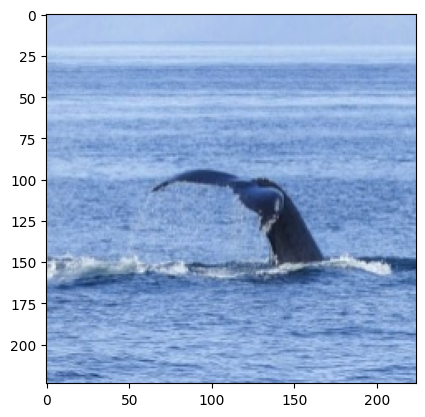

True label is: 14, CNN predicted 21 with confidence [0.08653484 0.00930069 0.02703221 0.0026367  0.04617218 0.01200517
 0.06118645 0.09834007 0.04355373 0.09424937 0.00492989 0.00665205
 0.02464497 0.0189699  0.01753337 0.00520062 0.00918559 0.01063443
 0.04620288 0.16089258 0.01145744 0.17055069 0.03213419]


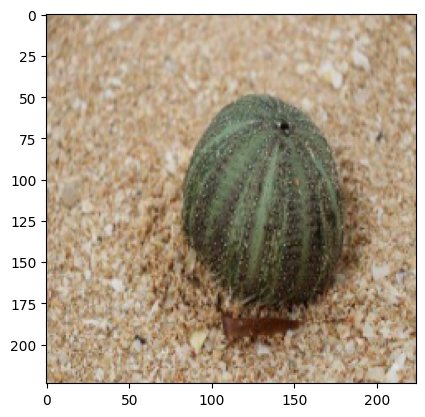

True label is: 22, CNN predicted 3 with confidence [4.9704645e-04 1.5914645e-04 4.1549481e-04 4.5582488e-01 1.0932334e-03
 2.1070584e-03 2.4358591e-04 2.2634054e-03 1.7113551e-04 1.4460486e-03
 1.0622955e-03 1.2777081e-01 3.6132464e-03 1.3655416e-02 1.4217614e-05
 1.1798439e-04 8.7032877e-02 1.3260111e-02 2.6423723e-04 2.1700060e-03
 6.2382525e-05 4.8952352e-04 2.8626591e-01]


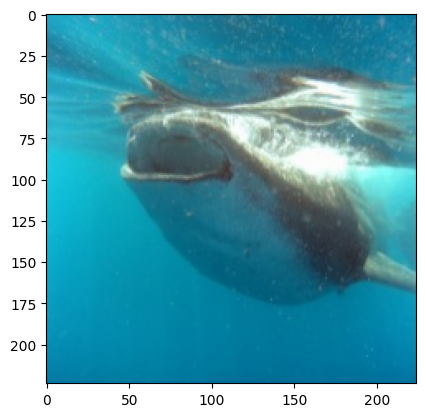

True label is: 22, CNN predicted 21 with confidence [2.5466718e-03 2.1278592e-04 4.1770487e-05 2.6202139e-03 6.4676802e-04
 3.8559298e-04 3.9769518e-03 1.3564145e-03 1.5316225e-04 7.8487992e-03
 6.6970787e-03 2.1299247e-02 2.6776413e-03 7.9248166e-03 1.8922414e-04
 2.3517287e-03 1.0283533e-03 1.5265159e-02 1.4504425e-03 7.0403358e-03
 2.4506720e-04 9.1015714e-01 3.8846405e-03]


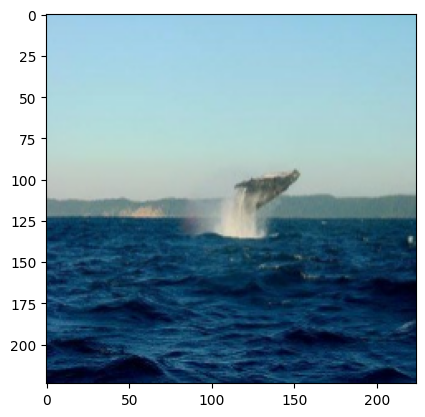

True label is: 1, CNN predicted 5 with confidence [9.4799258e-02 3.8705003e-02 4.3645609e-04 4.2924017e-04 4.7292661e-02
 4.9683473e-01 1.5277301e-03 1.5296297e-03 1.2717318e-02 3.1939063e-02
 3.1863532e-05 3.6223067e-04 1.4528820e-01 3.4574926e-04 1.6808574e-03
 8.1806621e-03 1.4333264e-04 6.9567356e-03 6.4020894e-02 4.2336918e-02
 8.2133804e-04 5.8763550e-04 3.0324745e-03]


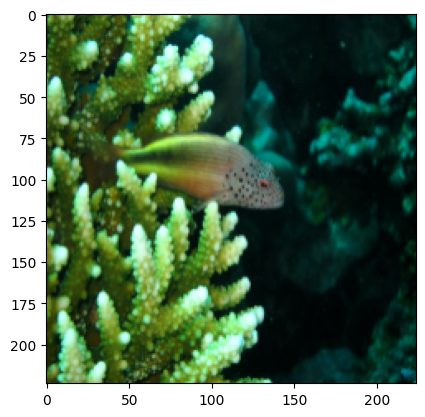

True label is: 0, CNN predicted 8 with confidence [6.7730509e-02 3.9487276e-02 1.7688299e-03 1.4811671e-04 9.6154017e-03
 2.4602722e-02 1.0752865e-02 1.9014233e-01 3.1939149e-01 3.0192818e-02
 8.0009620e-04 1.0640561e-03 1.6834239e-02 3.3112736e-03 3.7029449e-02
 4.9535614e-02 7.0889327e-03 3.5431348e-03 1.4795922e-01 3.0109515e-02
 5.4518702e-03 2.5065092e-03 9.3367376e-04]


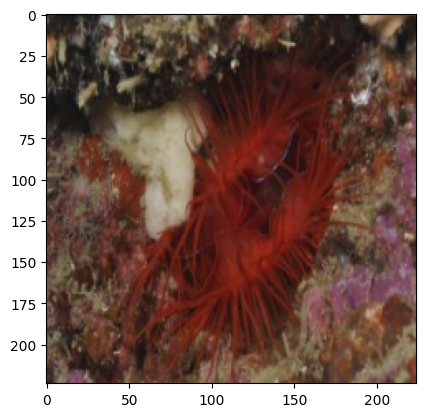

1/1 [==============================] - 0s 36ms/step
True label is: 12, CNN predicted 0 with confidence [4.4262320e-01 1.8555200e-01 3.2558816e-04 6.5778426e-05 6.5464877e-02
 4.4307064e-02 2.4672369e-03 9.1704661e-03 2.0822128e-02 7.2021902e-02
 1.1658304e-03 4.3762231e-04 1.0368965e-02 8.4468495e-04 2.5112289e-03
 8.9389913e-02 1.9012002e-03 5.1773190e-03 1.4890545e-02 3.2999364e-03
 2.4637312e-02 2.4889102e-03 6.6408094e-05]


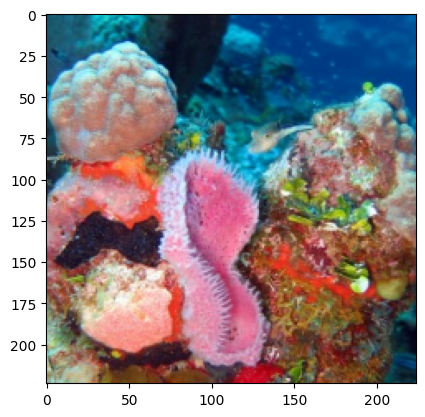

True label is: 3, CNN predicted 21 with confidence [5.7145059e-02 2.6223978e-03 9.7369702e-05 4.2379670e-02 3.2787569e-04
 1.0042779e-02 1.1370604e-02 6.3101828e-02 2.3042629e-03 7.3806024e-03
 6.3284887e-03 1.5590791e-02 5.7684667e-03 3.2231135e-03 9.0854714e-04
 1.1230993e-01 4.5066468e-02 2.7748302e-03 9.5526753e-03 2.8861374e-02
 5.1793997e-04 5.4245496e-01 2.9869918e-02]


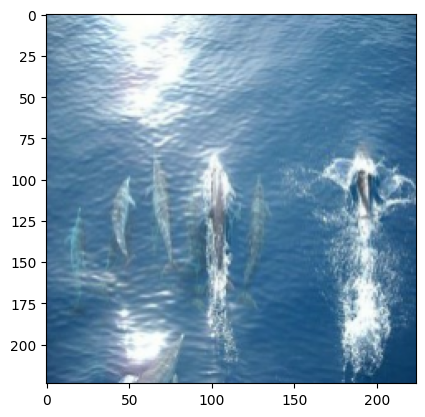

True label is: 9, CNN predicted 20 with confidence [7.6307189e-03 4.0231159e-04 2.0135175e-03 6.2652311e-04 4.8976281e-04
 4.4915912e-04 2.0579463e-03 2.3352457e-04 1.1938586e-03 2.9493328e-02
 5.6730211e-04 5.2628759e-03 6.1469432e-04 2.9256176e-03 4.8706493e-06
 1.2132550e-02 5.0592289e-04 3.2939909e-03 8.4129319e-04 4.3152967e-03
 9.2201602e-01 2.2680659e-03 6.6086493e-04]


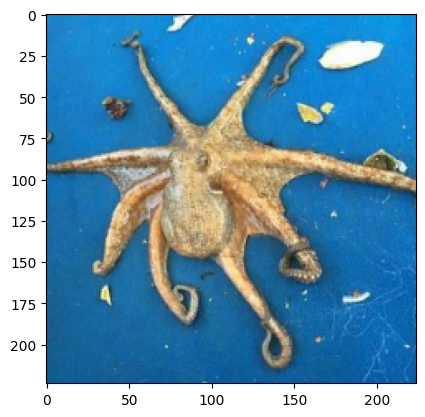

True label is: 16, CNN predicted 3 with confidence [0.01972688 0.00058034 0.11486293 0.21801436 0.01797901 0.02164553
 0.00047742 0.01214591 0.01169987 0.01139022 0.00739751 0.01947244
 0.05188541 0.0491202  0.00153624 0.0423205  0.07714432 0.20285991
 0.01641307 0.00474026 0.01108284 0.08228216 0.0052227 ]


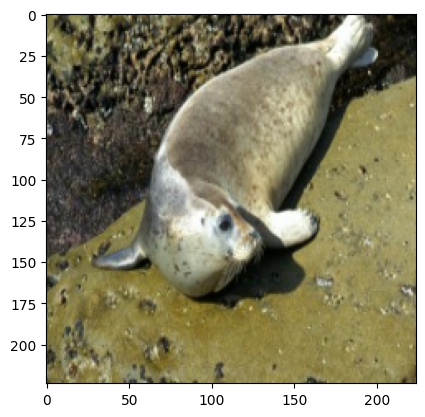

True label is: 11, CNN predicted 16 with confidence [1.01083308e-03 1.27721042e-03 1.87695608e-03 7.45366502e-04
 5.41065412e-04 8.87442846e-04 9.54144998e-05 4.68265614e-04
 2.77047424e-04 3.82290073e-02 7.86043555e-02 2.46546820e-01
 1.20852655e-02 2.94116768e-03 5.63439680e-05 1.70324769e-04
 6.08595371e-01 6.71934977e-04 2.64117290e-04 8.34277831e-04
 2.89338845e-04 1.00197922e-03 2.53007701e-03]


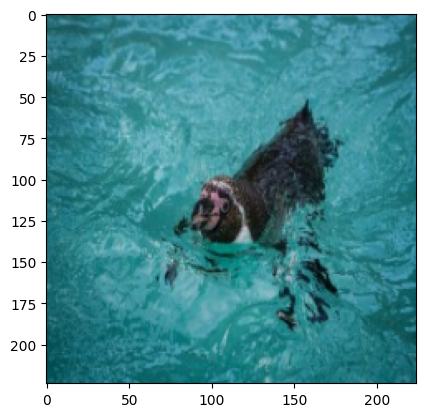

True label is: 22, CNN predicted 3 with confidence [6.6468110e-03 2.3400436e-04 1.7799761e-03 7.2703791e-01 7.2618999e-04
 1.0002231e-03 2.1207190e-04 5.4888154e-04 9.5400919e-04 2.5243094e-04
 1.9971894e-02 2.4126284e-02 1.8843348e-04 4.8324061e-03 3.8139481e-04
 1.0157486e-03 1.5798777e-02 2.4563473e-02 5.4342225e-05 1.8821902e-03
 3.9936323e-03 1.4238407e-01 2.1414882e-02]


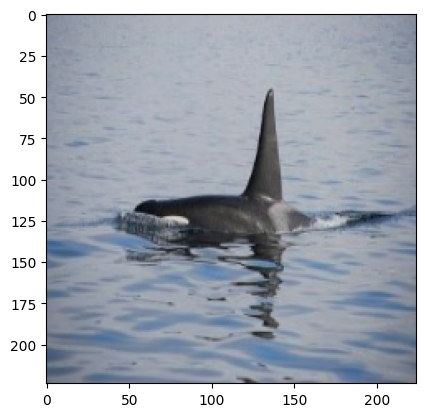

True label is: 9, CNN predicted 5 with confidence [4.3949809e-02 1.0558630e-02 1.9943735e-03 7.9219101e-04 9.7289812e-03
 6.6461432e-01 3.8281619e-03 1.6940635e-02 6.0090991e-03 8.9670029e-03
 7.0436625e-04 8.3161062e-03 7.0510558e-03 5.5891327e-03 2.1133244e-04
 4.8232987e-03 1.9418815e-02 7.9104509e-03 3.3407961e-03 1.7180695e-01
 7.1949814e-04 2.5159144e-03 2.0905609e-04]


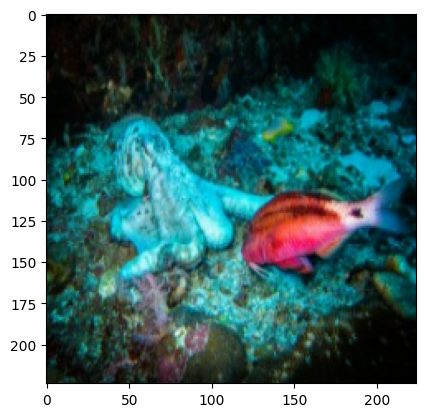

True label is: 12, CNN predicted 0 with confidence [3.1301543e-01 2.0898724e-01 1.2574578e-03 2.8666345e-04 1.0734415e-01
 8.6619593e-03 6.0209357e-05 3.8288884e-02 6.6869535e-02 6.8541922e-02
 1.5271273e-04 1.6370885e-03 1.9343168e-02 6.0810340e-03 6.1384263e-04
 9.4059100e-03 3.0851702e-04 2.3183033e-02 1.1068534e-01 1.1475464e-02
 1.9616680e-03 1.6122290e-03 2.2655458e-04]


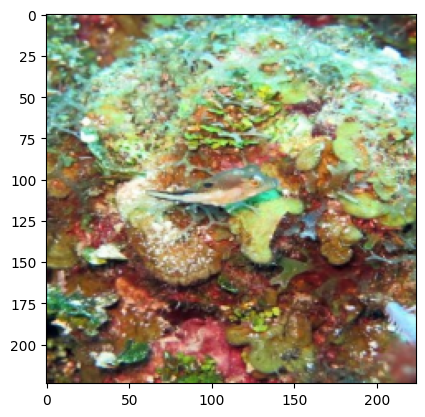

1/1 [==============================] - 0s 35ms/step
True label is: 12, CNN predicted 0 with confidence [2.22597167e-01 4.39878330e-02 2.58104391e-02 2.69530137e-04
 7.73347542e-02 1.12253085e-01 2.09314589e-04 4.17213049e-03
 2.30478253e-02 8.12889934e-02 8.80941842e-03 1.49201555e-02
 1.59169450e-01 1.32738017e-02 1.62985995e-01 1.19854202e-02
 4.14131582e-03 2.22099503e-03 1.49348397e-02 9.81542561e-03
 4.88651730e-03 1.76200888e-03 1.23534483e-04]


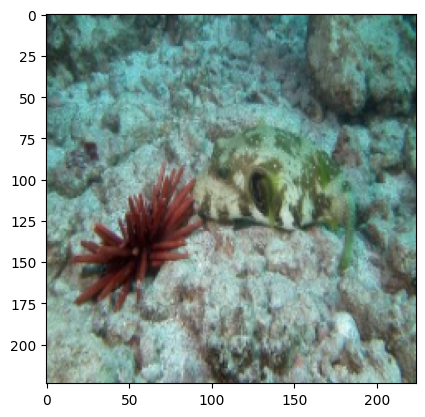

True label is: 17, CNN predicted 21 with confidence [0.01646351 0.00536824 0.00256847 0.00285073 0.04399448 0.00905707
 0.00198859 0.005657   0.00575074 0.00668358 0.01202371 0.14700842
 0.02706828 0.11441351 0.00209303 0.2240001  0.0590787  0.02871917
 0.00891141 0.00501715 0.0051054  0.26033834 0.00584034]


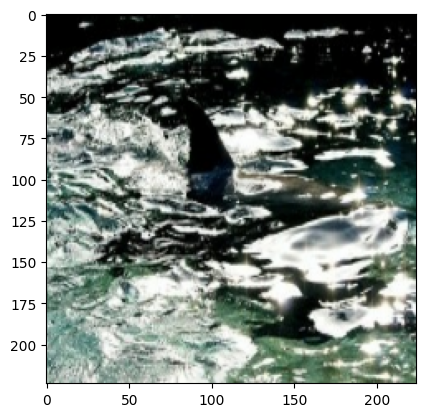

True label is: 3, CNN predicted 21 with confidence [2.3614861e-04 2.4418012e-04 1.4061690e-04 1.5615752e-04 1.4774264e-04
 6.9574942e-04 1.2676213e-02 4.8801992e-03 2.7775831e-04 1.1930752e-03
 8.6651770e-03 2.7258324e-02 3.0963361e-04 7.0838794e-02 3.8339369e-04
 2.9946363e-01 5.3130272e-03 3.9335117e-03 3.9740212e-02 3.3023395e-03
 3.3982898e-04 5.1743788e-01 2.3664401e-03]


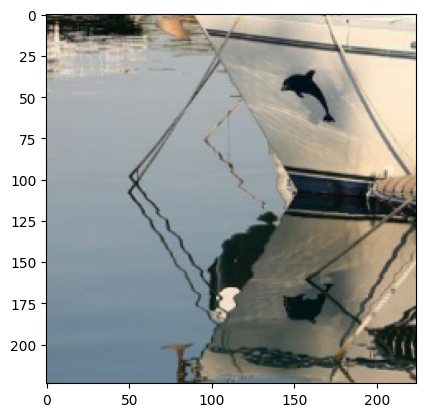

True label is: 5, CNN predicted 22 with confidence [4.86928417e-04 3.34807351e-04 1.18786593e-05 1.25575217e-03
 1.56517504e-04 1.30812009e-03 3.07627051e-04 1.82571262e-02
 2.50756111e-05 7.32451095e-04 1.42543086e-05 2.36604898e-03
 5.47295297e-03 4.33793466e-04 1.62599408e-05 6.38790196e-04
 4.43881989e-04 1.55967465e-02 2.64559942e-03 5.87172247e-03
 4.00314893e-04 2.12863175e-04 9.43010449e-01]


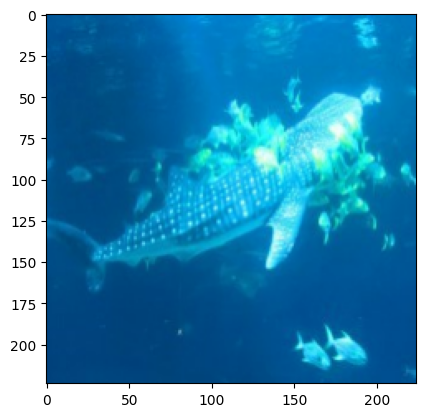

True label is: 18, CNN predicted 0 with confidence [0.28531718 0.12717818 0.00241446 0.00697753 0.14496908 0.07954738
 0.0024646  0.0311541  0.01741696 0.01336074 0.00471632 0.00196623
 0.03646576 0.00721223 0.0071365  0.05870317 0.00951695 0.00372143
 0.00595063 0.01043526 0.04044573 0.10185014 0.00107944]


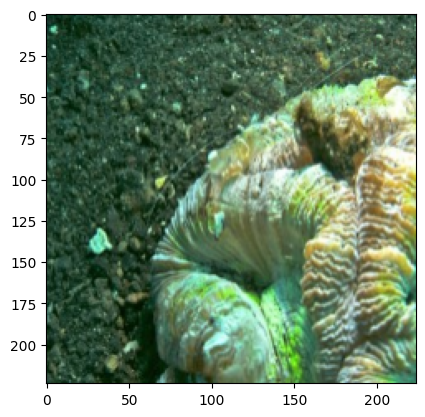

True label is: 22, CNN predicted 3 with confidence [1.2907867e-04 9.1701120e-05 2.2211438e-04 8.4744352e-01 4.5522803e-04
 1.5643191e-03 4.7027326e-05 2.6377491e-04 1.5632005e-04 8.0190039e-05
 2.8432482e-03 6.7981020e-02 2.0227698e-04 4.5629363e-03 8.5844777e-06
 2.0883133e-04 1.9889083e-03 7.7382494e-03 8.3066494e-05 3.1724642e-04
 1.7542046e-04 1.8055497e-03 6.1631430e-02]


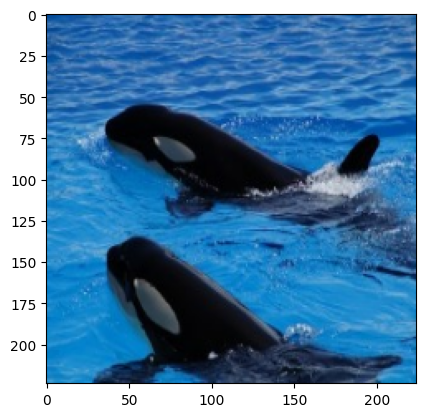

True label is: 4, CNN predicted 9 with confidence [1.55707940e-01 4.03121318e-04 2.60428642e-04 1.79209019e-05
 2.32091593e-03 2.05471893e-04 1.47962908e-03 4.22169658e-04
 1.28185023e-02 3.86811793e-01 1.41613185e-04 1.38396237e-04
 3.66596617e-02 7.87140627e-04 5.78308709e-06 6.62178025e-02
 1.07536376e-04 4.73523978e-04 7.10502779e-03 1.60227027e-02
 8.03060364e-04 3.10974360e-01 1.15611889e-04]


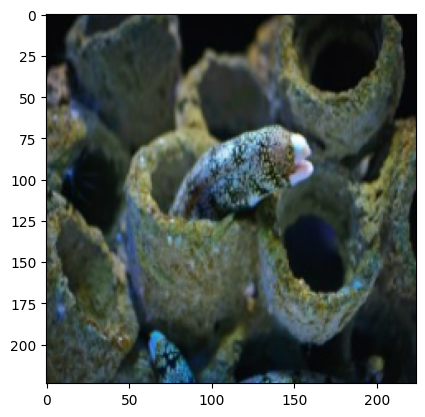

True label is: 12, CNN predicted 13 with confidence [3.4347516e-02 2.1294116e-03 4.5180120e-04 7.0080085e-04 8.6814603e-03
 1.3937322e-02 1.2928282e-01 2.0510345e-03 1.0657448e-02 1.0704572e-03
 3.7187411e-04 1.1364457e-03 1.5307610e-01 4.6246091e-01 2.2789948e-04
 3.7323737e-03 7.1323045e-02 6.3734446e-03 3.6075864e-02 4.6164900e-02
 5.2305392e-04 4.4279769e-03 1.0796087e-02]


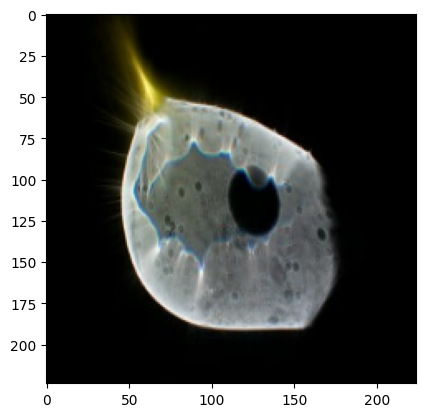

In [ ]:
batch_size=32
test_size=3000
batch_index=0

true_labels_arr = np.array([])
pred_labels_arr = np.array([])

#Get each batch of images and labels in test dataset
for image_batch,label_batch in test_ds:

    if batch_index>math.ceil(test_size/batch_size):
        break;

    y_pred = pretrained_model.predict(image_batch)

    y_pred_label=np.argmax(y_pred, axis=1)

    #print(label_batch)
    #print(y_pred_label)

    true_labels_arr = np.concatenate((true_labels_arr, label_batch), axis=None)

    pred_labels_arr = np.concatenate((pred_labels_arr, y_pred_label), axis=None)

    #get the indices of the missclassified images in the batch
    errors = np.where(y_pred_label != label_batch)[0]

    #display the missclassified images together with their predicted probabilities
    for i in errors:
        print(f"True label is: {label_batch[i]}, CNN predicted {y_pred_label[i]} with confidence {y_pred[i]}")
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.show()

    #get the next batch
    batch_index=batch_index+1

##**Classification Reports and Confusion Matrix**

In [ ]:
# Metrics
from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix


In [ ]:
# Predict the label of the test_images
pred = pretrained_model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

86/86 [==============================] - 562s 7s/step
The first 5 predictions: ['Shrimp', 'Lobster', 'Crabs', 'Whale', 'Turtle_Tortoise']


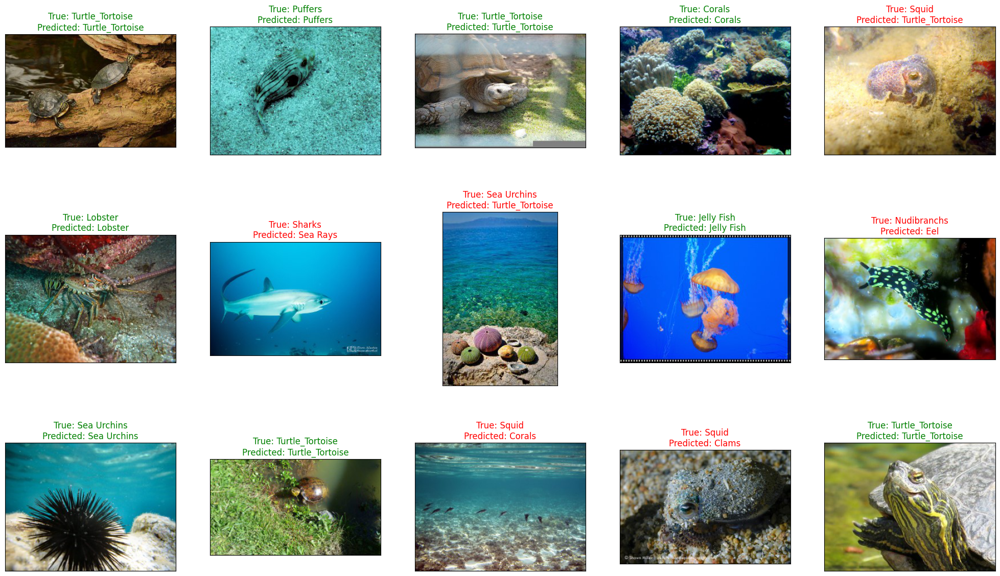

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [ ]:
# Metrics
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                 precision    recall  f1-score   support

          Clams       0.54      0.49      0.51       112
         Corals       0.49      0.59      0.54       101
          Crabs       0.81      0.84      0.83       103
        Dolphin       0.56      0.76      0.64       148
            Eel       0.30      0.36      0.33        98
           Fish       0.47      0.42      0.44       100
     Jelly Fish       0.84      0.86      0.85       184
        Lobster       0.66      0.63      0.65       101
    Nudibranchs       0.56      0.54      0.55        98
        Octopus       0.36      0.33      0.34       118
          Otter       0.92      0.96      0.94        90
        Penguin       0.68      0.63      0.66       100
        Puffers       0.41      0.37      0.39       107
       Sea Rays       0.48      0.50      0.49       104
    Sea Urchins       0.96      0.91      0.93       107
       Seahorse       0.66      0.54      0.59       105
           Seal       0.68    

In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
Clams,0.539216,0.491071,0.514019,112.000000
Corals,0.487805,0.594059,0.535714,101.000000
Crabs,0.813084,0.844660,0.828571,103.000000
Dolphin,0.556650,0.763514,0.643875,148.000000
Eel,0.299145,0.357143,0.325581,98.000000
Fish,0.466667,0.420000,0.442105,100.000000
Jelly Fish,0.841270,0.864130,0.852547,184.000000
Lobster,0.659794,0.633663,0.646465,101.000000
Nudibranchs,0.557895,0.540816,0.549223,98.000000
Octopus,0.357798,0.330508,0.343612,118.000000


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from keras.models import Model
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.applications import MobileNet
from sklearn.metrics import confusion_matrix
from keras.layers.core import Dense, Activation
from keras.metrics import categorical_crossentropy
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(15, 7), text_size=10, norm=False, savefig=False):


  # Create the confustion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])
        # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

     # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")



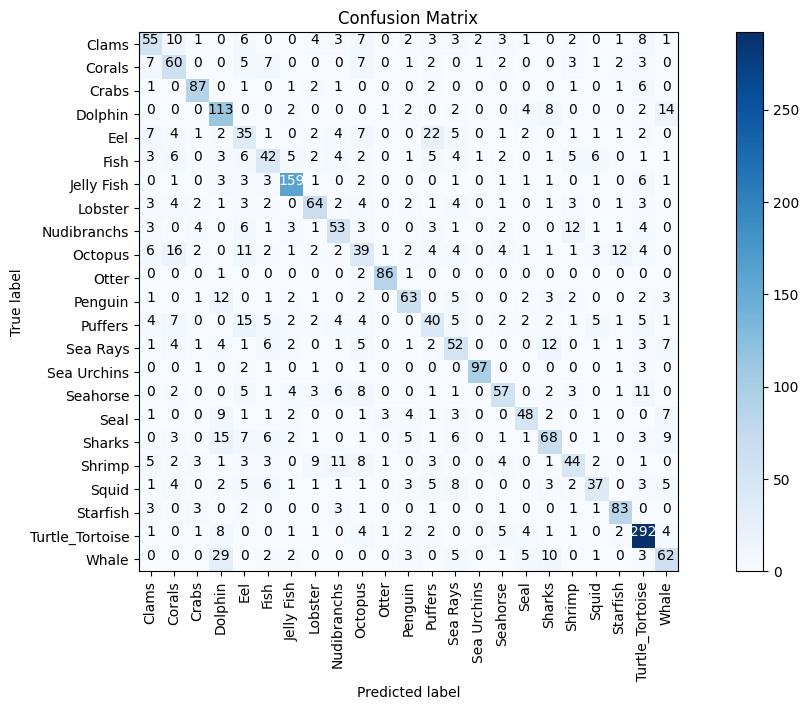

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))